# Visión por Computador - Práctica 1 - Filtrado de Imágenes

### Estudiante: <strong>PABLO RAMBLADO </strong>



---

## Normas de entrega

1. Para este trabajo, al igual que para los demás, se debe presentar código, resultados, discusión de los mismos, y presentación y análisis del trabajo realizado, todo integrado en el propio Google Colab Notebook (es decir, no se entrega ninguna memoria separada en `.pdf` ni ningún código `.py`). Se recuerda que código y resultados sin informe explicativo no puntúa.

2. En relación con el punto anterior, solo se acepta la entrega de ficheros `.ipynb` (no resulta válido entregar un fichero `.py`).

3. El diseño de celdas del documento debe ser respetado.

4. Solo se entregará el fichero `.ipynb` (incorporando código, resultados, y explicación del trabajo realizado y los resultados obtenidos) y no se enviarán las imágenes empleadas.

5. El path para la lectura de imágenes, o cualquier otro fichero de entrada, debe ser siempre “/content/drive/My Drive/images/nombre_fichero”

6. El código deberá  presentarse adecudamente comentado y con los resultados obtenidos en cada apartado, junto con la presentación del trabajo realizado y la discusión y análisis de los resultados obtenidos. Es importante reiterar que la entrega de código sin informe explicativo o valoraciones no puntúa. Por otro lado, el código debe ir comentado en comentarios en celdas de código, mientras que el análisis y discusión, tanto del trabajo realizado como de los resultados obtenidos, debe ir en celdas de texto.

Este trabajo de implementación tiene como objetivo principal **familiarizarse con la implementación y uso de filtros de convolución, así como del cálculo de las derivadas de una imagen y sus posibles aplicaciones**.








---



## Funciones de apoyo y conexión con Google Drive

In [ ]:
# We start by getting access to the drive
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
# We import the modules to use
import os,sys
import cv2, numpy as np, math
from matplotlib import pyplot as plt
import time
# change directory
%cd '/content/drive/My Drive'
#  the current directory
%pwd

# This allows to display images  and to save  them in cells
%matplotlib inline
# this definition allows to read files in a specific path
get_image = lambda route: os.path.join('/content/drive/My Drive/images', route)

/content/drive/My Drive


Las funciones que se incluyen a continuación, se proporcionan como ayuda/apoyo para el estudiante. **En caso de que el alumnado prefiera utilizar otras funciones para lectura, normalización y visualización de imágenes, tiene total libertad para hacerlo, pero sí debe justificar y explicar razonadamente el motivo de dicho cambio y describir las modificaciones realizadas.**

Recuérdese que todas las imágenes a emplear durante las prácticas de todo el curso se pueden encontrar en el enlace de Google Drive indicado en PRADO: https://pradogrado2425.ugr.es/mod/url/view.php?id=91457 En concreto, https://drive.google.com/drive/folders/1UtvY8q6w1Cz9a9T9zxIqSweoRLgNwoW-

In [ ]:
'''
This function receives a string with the filename of the image to read,
and a flag indicating if we want to read it in color/RGB (flagColor=1) or gray level (flagColor=0)

Example of use:
im1=readIm(get_image('apple.jpg'),0)

'''
def readIm(filename, flagColor=1):
  # cv2 reads BGR format
  im=cv2.imread(filename)
  # change to  RGB and return the image
  if(flagColor):
    return cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
  # change from BGR to grayscale instead if flag is 0
  return cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)

In [ ]:
'''
This function receives an array of arbitrary real numbers (that could include even negative values),
and returns an 'image' in the range [0,1].
flag_GLOBAL allows the user to normalize the whole image (including all channels) or to normalize
each channel/band independently.
'''
def rangeDisplay01(im, flag_GLOBAL= True):
  im = im.astype(float)
  if flag_GLOBAL:
    im = (im - im.min())/(im.max() - im.min())
  else:
    # bands normalization
    for band in range(im.shape[2]):
      im[:, :, band] = (im[:, :, band] - im[:, :, band].min())/(im[:, :, band].max() - im[:, :, band].min())
      # Note: remember that, for plt.imshow with RGB data, the valid range is [0..1] for floats and [0..255] for integers.
  return im

In [ ]:
'''
This function displays a single image, including a title, using a magnification factor.

Example of use:
im1=readIm(get_image('apple.jpg'),0)
displayIm(im1,'Manzana',0.5)

'''
def displayIm(im, title='Result',factor= 2):
  # First normalize range
  max=np.max(im)
  min=np.min(im)
  if min<0 or max>255:
    im=rangeDisplay01(im,flag_GLOBAL=True)
  if len(im.shape) == 3:
    # im es tribanda
    plt.imshow(im, cmap='jet')
  else:
    # im es monobanda
    plt.imshow(im, cmap='gray')
  figure_size = plt.gcf().get_size_inches()
  plt.gcf().set_size_inches(factor * figure_size)
  plt.title(title)
  plt.xticks([]), plt.yticks([]) # eliminamos numeración
  plt.show()

In [ ]:
'''
This function displays multiple images (including a title and using a magnification factor)
of equal size. The input to the function is a list of images.

Example of use:
im1=readIm(get_image('apple.jpg'),1)
images = [im1,im1,im1]

displayMI_ES(images, title='Manzanas',factor=1)

IMPORTANT NOTE: it is important to notice that this function stacks all images
and later call displayIm(). This implies that the normalization (rangeDisplay01()) is done
at the very end of the process. As a consequence, if the stacked images have different
range values they can be displayed in a "weird" way (with black regions (pixel value = 0)
looking grey). In case the visualization seems to be a problem, a possible solution
would be to create vim using vim.append(rangeDisplay01(...)). In this way, all images
would be on the same range of values (negative values around 0 (black),
0 values around 0.5 (grey), and positive values closer to 1 (white))

'''
def displayMI_ES(vim, title='Result',factor=2):
  # We set the maximun number of images to concatenate by columns
  maxcolumns=3
  # number of images to display
  numberim=len(vim)
  # The simplest case, one row: the maximum number of columns is larger than the images to stack
  # This is, by default, we put together the images column-wise
  if len(vim) < maxcolumns:
    out=vim[0]
    for item in range(1,len(vim)):
      #displayIm(out,str(item),1)
      out=np.hstack((out,vim[item]))

  # Else, if maxcolumns is smaller or equal than the number of images to stack
  else:
    # We check if all rows and columns are going to be 'busy', or if otherwise we need an extra-row
    if np.mod(len(vim),maxcolumns)== 0:
      maxrows=numberim//maxcolumns
    else:
      maxrows=numberim//maxcolumns+1

    # we build up the first block-row
    out=vim[0]
    for item in range(1,maxcolumns):
      out=np.hstack((out,vim[item]))
    # We build up the rest of block-rows
    for block in range(1,maxrows):
      #print(block)
      row=vim[block*maxcolumns]
      for item in range(1,maxcolumns):
        # We still have images to stack
        if block*maxcolumns+item < numberim:
          row=np.hstack((row,vim[block*maxcolumns+item]))
        # We do not have more images, and we have to fill with black
        else:
          row=np.hstack((row,np.zeros(vim[0].shape,dtype=vim[0].dtype)))
          #print(row.dtype)
          # if we don't include ',dtype=vim[0].dtype', np.zeros will include float
          # numbers in the matrix. This will make that the whole matrix will be
          # considered as floats, and values larger than 1 will be clipped to 1,
          # displaying an almost totally white image
      # add the new block-row
      out=np.vstack((out,row))
  return displayIm(out,title,factor)

# **Ejercicio 1: discretización de máscaras y filtrado Gaussiano** (6 puntos)

En este ejercicio aprenderemos a discretizar máscaras de convolución y a aplicarlas sobre imágenes empleando funciones de OpenCV. También buscamos hacerlo de un modo eficiente, y es por ello que, en toda la práctica, se exige el uso de convoluciones 1D (separables).





## A) (1.5 puntos)

> *En este apartado se deben realizar las siguientes tareas:*
1. *Calcular las máscaras discretas 1D de la Gaussiana, así como su primera y segunda derivadas (normalizadas), considerando que la entrada a dicha función de creación de máscaras 1D puede ser tanto un posible sigma como un posible tamaño de máscara.*
2.*Emplear los siguientes valores de sigma ($\{1, 1.5, 2.5, 6\}$) y los siguientes valores de tamaño de máscara ($\{7, 11, 15\}$), y mostrar el perfil (es decir, la silueta de las máscaras como funciones 1D) para verificar que las máscaras creadas son correctas.*
3. *Describir/explicar/analizar si las formas de dichos kernels tienen sentido y se corresponden con lo que esperaríamos ver.*

Como vimos en la teoría, la **función Gaussiana** es la siguiente:

$$ f(x, \sigma) = c \cdot e^{-\frac{x^2}{2\sigma^2}} $$

- $\sigma$ es la desviación estándar que controla el ancho de la curva

- $𝑐$ es la constante de normalización que **se puede ignorar en el cálculo inicial del filtro**, ya que no afecta la forma de la curva. Esta tambien puede escribirse de la forma $ \frac{1}{\sigma \sqrt{2\pi}}  $

<br>

Si queremos **calcular las derivadas de la función Gaussiana**, de las diapositivas podemos obtener que partiendo de la formula Gaussiana $ g_{\sigma}(x) $ sin la constante de normalización; la primera $g_{\sigma}'(x)$ y segunda $g_{\sigma}''(x)$ derivada son las siguientes :

$$ g_{\sigma}'(x) = -\frac{x}{\sigma^2} \cdot g_{\sigma}(x) $$

$$ g_{\sigma}''(x) = (\frac{x^2}{\sigma^4} - \frac{1}{\sigma^2}) \cdot g_{\sigma}(x) $$

<br>

Para **crear las máscaras discretas** , sabemos que el valor de $k$ define la mitad entera del tamaño de la máscara $T$ y debe ser al menos $3\sigma$ para cubrir adecuadamente el área bajo la curva. La fórmula de la máscara Gaussiana, $T = 2k + 1$ también escrita como $T = 2\cdot(3\cdot\sigma) + 1$.

Como resultado, el rango de la máscara debe ser de [$-k$, 0, $k$]. Esto es, dado que $ k = \frac{T-1}{2}$, el rango de la máscara será [$- \frac{T-1}{2}$, $\frac{T+1}{2}]$, lo que permite distribuir los valores simétricamente alrededor del centro. Poniendo un ejemplo, si tenemos que $T=7$ el rango será de [$- \frac{7-1}{2}$, $\frac{7+1}{2}]$, es decir de [$-3$, $3]$.

<br>

Por ello cualquier valor del tamaño de máscara o de sigma que no sean válidos, debemos solucionarlos. Hay que tener en cuenta que si ambos fueran menores o igual a 0, asignaremos los valores mínimos a sigma $\sigma=1$ y el tamaño de máscara a $T=7$. Y si el valor de sigma es válido pero el tamaño de máscara no, se calculará este último en base al valor del sigma y viceversa.

Las fórmulas para calcular cada valor son:
- $3\cdot\sigma = \frac{T-1}{2} \rightarrow \sigma = \frac{T-1}{6}$

- $T = 2\cdot(3\cdot\sigma) + 1 \rightarrow T = 6\cdot\sigma + 1$

<br>

Finalmenta para normalizar la máscara obtenida de la funcion Gaussiana debemos dividir esta por la suma de sus coeficientes, de esta forma escalamos la máscara para que se mantenga proporcional, pero con una magnitud total normalizada.

Para la primera y segunda derivada debemos multiplicar la propia mascára por el valor de sigma y sigma al cuadrado respectivamente para mantener la consistencia en las gráficas.

In [ ]:
def GaussFunc(x,sigma):
    return pow(math.e, -(x**2)/(2*sigma**2))

def GaussDeriv1Func(x,sigma):
    return (-x/sigma**2) * GaussFunc(x,sigma)

def GaussDeriv2Func(x,sigma):
    return (x**2/sigma**4 - 1/sigma**2) * GaussFunc(x,sigma)

# Si "get_all" = "false", devuelve solo la máscara en otro caso los valores necesarios
def gaussianMask1D(sigma=0, sizeMask=0, order=0, get_all=False):
    # Asignaciones mínimas si ambos son no válidos
    if sizeMask <= 0 and sigma <= 0:
      sigma = 1.0
      sizeMask = 7

    elif sigma <= 0: # Calcular correctamente sigma
      if sizeMask % 2 == 0: sizeMask -= 1
      sigma = round((sizeMask - 1) / 6, 3)

    elif sizeMask != (temp := 6 * sigma + 1) or sizeMask == 0: # Calcular la máscara correctamente
      sizeMask = int(temp)
      if sizeMask % 2 == 0: sizeMask -= 1

    # Capturamos el rango de valores enteros
    K = (sizeMask - 1) // 2
    x_vals = np.linspace(-K, K, num=sizeMask, dtype=int)
    #print(f"T={sizeMask}\nσ={sigma}\nk={K}\nPositions={x_vals}")

    # Segun el orden se crea una mascara u otra y se normaliza
    # order = 0 -> función Gaussiana
    # order = 1 -> derivada de la Gaussiana
    # order = 2 -> derivada segunda de la Gaussiana
    if order == 0:
        mask = np.array([GaussFunc(x, sigma) for x in x_vals])
        mask /= np.sum(mask)

    elif order == 1:
        mask = np.array([GaussDeriv1Func(x, sigma) for x in x_vals])
        mask *= sigma

    elif order == 2:
        mask = np.array([GaussDeriv2Func(x, sigma) for x in x_vals])
        mask *= sigma**2

    else:
        print("'Order' tiene que ser 0, 1 o 2")

    return (x_vals, mask, sigma, sizeMask) if get_all else mask

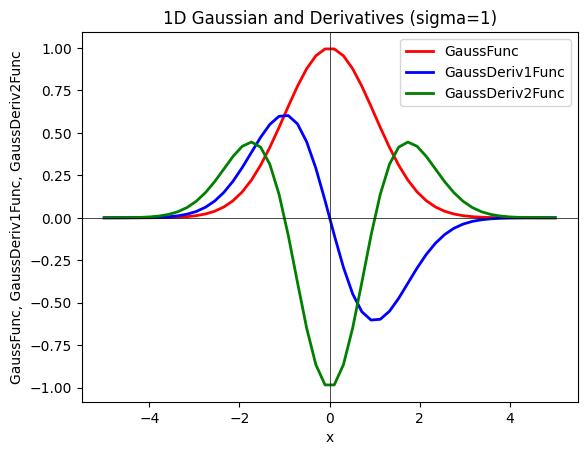

In [ ]:
# Con la siguiente figura verificamos que las funciones Gaussianas implementadas son correctas
plt.figure()
xvalues = np.linspace(-5, 5)
yvalues1 = GaussFunc(xvalues,1)
yvalues2 = GaussDeriv1Func(xvalues,1)
yvalues3 = GaussDeriv2Func(xvalues,1)
plt.plot(xvalues, yvalues1, lw=2, color='red', label='GaussFunc')
plt.plot(xvalues, yvalues2, lw=2, color='blue', label='GaussDeriv1Func')
plt.plot(xvalues, yvalues3, lw=2, color='green', label='GaussDeriv2Func')
plt.title('1D Gaussian and Derivatives (sigma=1)')
plt.xlabel('x')
plt.ylabel('GaussFunc, GaussDeriv1Func, GaussDeriv2Func')
plt.axhline(0, lw=0.5, color='black')
plt.axvline(0, lw=0.5, color='black')
plt.legend();

**Función Gaussiana**
<p align="justify">
En las imagenes de abajo observamos como cambian las formas de los kernels al ajustar sigma. Cuando sigma incrementa, el tamaño de la máscara también lo hace, distribuyendo los valores del kernel sobre un área mayor, lo que genera una función más suave y extensa. Cuando sigma es pequeño, el kernel es estrecho y concentrado en el centro, mientras que al aumentar sigma el kernel se vuelve más ancho y cubre un rango mayor. Esta propiedad de la función gaussiana, con su característica forma de campana, permite lograr un efecto de difuminado en la imagen: el peso mayor se asigna a los píxeles cercanos al centro del kernel, logrando así una suave transición entre los píxeles. Este tipo de filtro elimina las altas frecuencias, conservando solo las bajas (información explicada en el ejercicio 3), por lo que al suavizar una imagen, el kernel gaussiano proporciona un desenfoque más natural.
</p>


<br>

**Primera derivada Gaussiana**
<p align="justify">
En los kernels de la primera derivada de la función gaussiana (primera columna), se puede observar un cruce del eje x en el centro, con una simetría entre valores positivos y negativos. Este tipo de kernel se utiliza para la captura de detalles finos en una imagen, permitiendonos detectar los bordes existentes en esta. A medida que sigma aumenta, el kernel se ensancha con el crecimiento de la máscara, permitiendo identificar bordes más amplios aunque menos definidos. La derivada respecto a $X$ se enfoca en la diferencia de intensidad entre los píxeles situados a ambos lados del píxel central, asignándoles pesos opuestos y resaltando cambios bruscos de intensidad en la dirección horizontal, característicos de texturas y bordes.
<p align="justify">
De forma similar, la derivada respecto a $Y$ se enfoca en cambios de intensidad en la dirección vertical. La derivada de la función permite detectar máximos y mínimos relativos, resaltando las zonas de cambios bruscos en zonas cercanas al píxel central. Cuanto mayor es el cambio de intensidad, mayor es el valor absoluto de la derivada, indicando la presencia de un borde.</p>


<br>

**Segunda derivada Gaussiana**
<p align="justify">
La segunda derivada gaussiana (segunda columna), permite identificar los máximos y mínimos relativos de la primera derivada, es decir, los puntos donde la segunda derivada se anula. Estos puntos suelen representar cambios bruscos de intensidad, por lo que la segunda derivada permite localizar detalles finos de una imagen, proporcionando incluso mayor precisión en la detección de bordes que la primera derivada.

En el caso de la segunda derivada gaussiana, el kernel tiene una forma con picos opuestos alrededor de un valor central negativo, lo que lo hace efectivo para detectar puntos de inflexión o cambios rápidos en la intensidad. Al aumentar el valor de sigma, la máscara se amplía y el kernel cubre un rango mayor, permitiendo así detectar bordes finos en escalas más amplias.

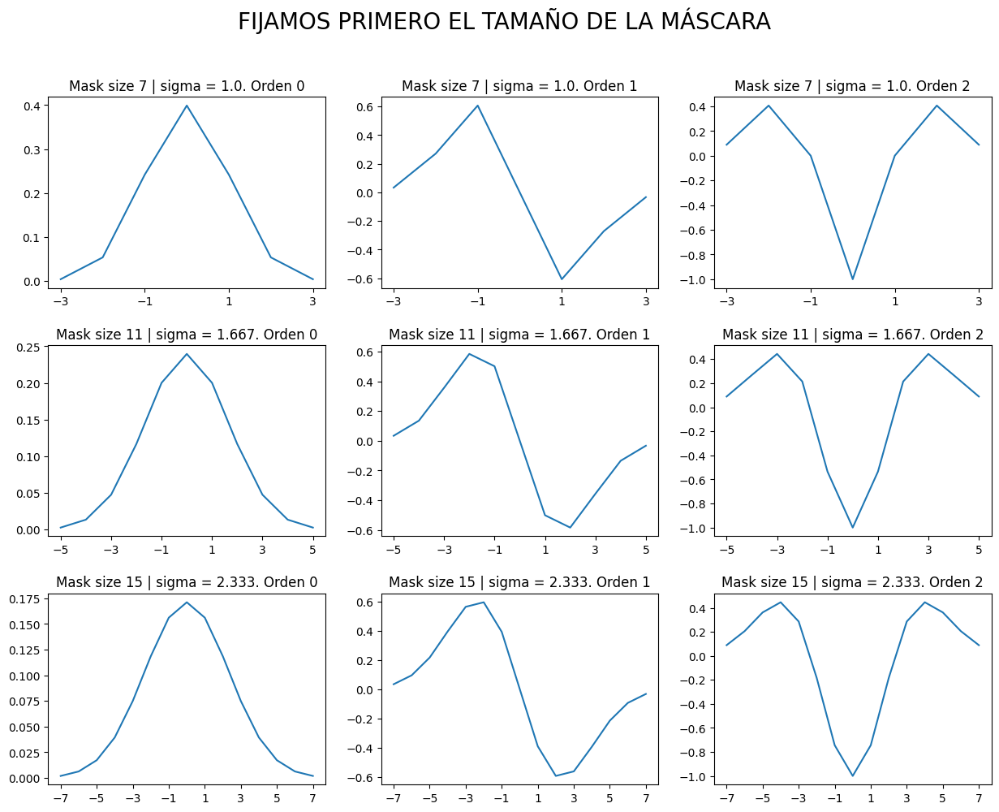

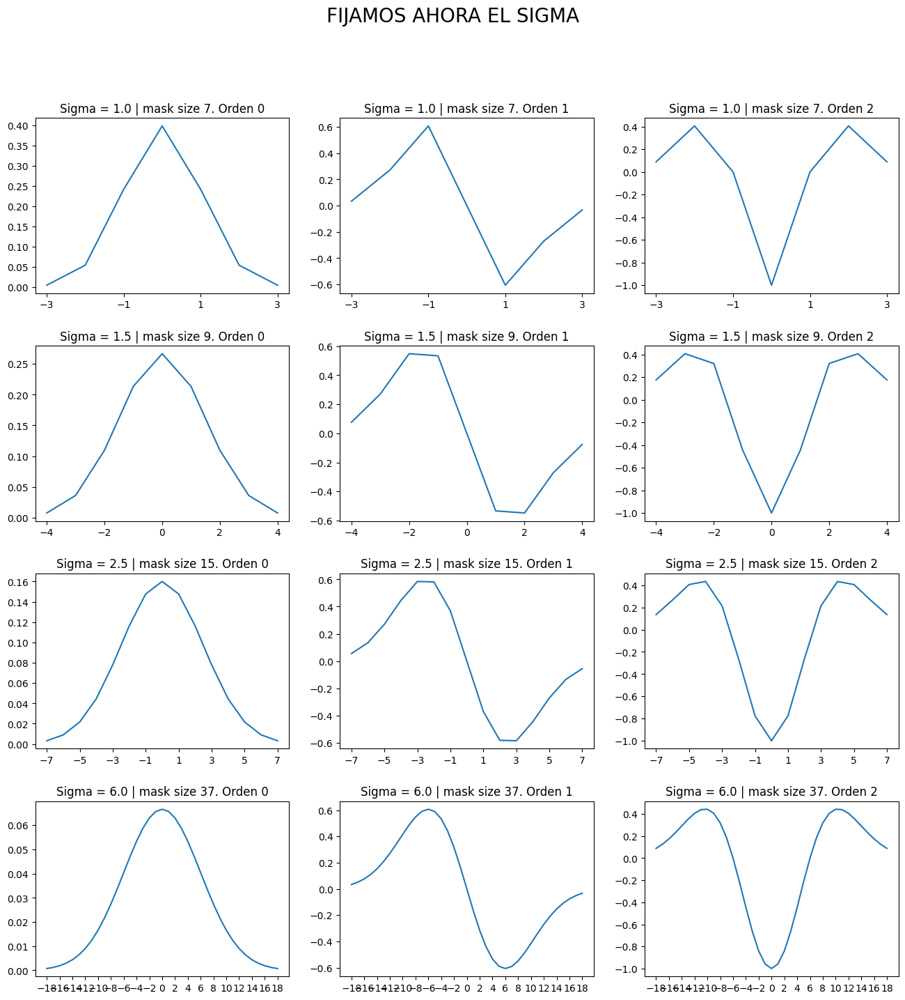

In [ ]:
sigma_values = [1.0, 1.5, 2.5, 6.0]
size_masks = [7, 11, 15]

plt.rcParams["figure.figsize"] = (15,3) # para ajustar tamaño del ancho y alto (ejes)
# TAMAÑO DE MASCARA
fig, axs = plt.subplots(3, 3, figsize=(15,11)) # Gráfica de 3 filas X 3 columnas
for row, sizeMask in enumerate(size_masks):
  for i in range(0,3):
    x_vals, mask, sigma, sizeMask = gaussianMask1D(0, sizeMask, order=i, get_all=True)
    axs[row, i].plot(x_vals, mask)
    axs[row, i].set_title(f"Mask size {sizeMask} | sigma = {sigma}. Orden {i}")
    # Ajustar leyenda del eje "x" (se le suma +1 al "max" ya que este no se incluye)
    axs[row, i].set_xticks(np.arange(np.min(x_vals), np.max(x_vals)+1, 2.0))

fig.suptitle('FIJAMOS PRIMERO EL TAMAÑO DE LA MÁSCARA', fontsize=20)
plt.subplots_adjust(hspace=0.3)
plt.show()


# TAMAÑO DE SIGMA
fig, axs2 = plt.subplots(4, 3, figsize=(16,16)) # Gráfica de 4 filas X 3 columnas
for row, sigma in enumerate(sigma_values):
  for i in range(0,3):
    x_vals, mask, sigma, sizeMask = gaussianMask1D(sigma, 0, order=i, get_all=True)
    axs2[row, i].plot(x_vals, mask)
    axs2[row, i].set_title(f"Sigma = {sigma} | mask size {sizeMask}. Orden {i}")
    axs2[row, i].set_xticks(np.arange(np.min(x_vals), np.max(x_vals) + 1, 2.0))

print("\n")
fig.suptitle('FIJAMOS AHORA EL SIGMA', fontsize=20)
plt.subplots_adjust(hspace=0.3)
plt.show()

## B) (1.5 puntos)

> *En este apartado se debe leer una imagen en escala de grises (`'zebra.jpg'`) y esta debe ser filtrada mostrando el resultado de la convolución con una Gaussiana, con la primera derivada de la Gaussiana (tanto en $X$ como en $Y$), y con la segunda derivada de la Gaussiana (tanto en $X$ como en $Y$). Para ello, hay que:*
1. *emplear los siguientes sigmas ($\{0.75,1,2,4,8, 16\}$),*
2. *usar la función de OpenCV `sepFilter2D()` con las máscaras calculadas a partir de las funciones desarrolladas en el apartado anterior,*
3. *mostrar todas las imágenes dentro del mismo canvas, tal y como se muestra más abajo,*
4. *analizar los resultados obtenidos y discutir si se corresponden con lo se esperaría obtener en base a nuestro conocimiento de la teoría.*

<p align="justify">
Antes de nada, hay que tener en cuenta que los resultados obtenidos en las derivadas de la imagen se ven en tonos de gris debido a lo siguiente: tanto en la primera como en la segunda derivada, el cálculo involucra a los píxeles vecinos, ya sea de forma vertical u horizontal. Por ejemplo, en la primera derivada vertical, se toman los valores de los píxeles situados arriba y abajo de cada píxel central, restando el valor del píxel superior del valor del píxel inferior. Si esta resta se realiza en una zona uniforme de la imagen (por ejemplo, una región completamente blanca con valor 255), el resultado será cero (255 - 255 = 0), indicando que no hay cambios de intensidad entre esos píxeles.

<p align="justify">
Dado que en la normalización de los valores derivados se establece un rango de -255 a 255 (donde -255 representa el cambio máximo negativo de negro a blanco, y 255 el cambio máximo positivo de blanco a negro), el valor 0 se mapea al tono medio de este rango. Este tono medio corresponde a un gris neutro en la escala de blanco y negro. Como resultado, en áreas uniformes, los cálculos de las derivadas se traducen en valores de gris, mientras que en los bordes o transiciones bruscas de la imagen aparecen contrastes claros y oscuros debido a los cambios más significativos en la intensidad de los píxeles.

<br>

La función `sepFilter2D()` sirve para aplicar un filtro 2D teniendo 2 kernel 1D, primero aplica uno para la parte horizontal y luego otro para el vertical, reduciendo así el número de operaciones necesarias en el caso de un filtro 2D directo.

<br>

Vamos a explicar los resultados obtenidos en cada imagen distinta :
- **Zero derivative [0,0]** : Aqui simplemente se aplica un filtro gaussiano, que como explicamos anteriormente, cuanto mayor sea el sigma empleado, mayor será el suavizado que se le aplica. Por ende tiene sentido que cada imagen cada vez se vea mas borrosa.

<br>

- **First derivative [0,1]** : Lo que estamos haciendo es realzar los bordes verticales mientras suavizamos las características horizontales. La función gaussiana disminuye los detalles finos horizontalmente, reduciendo el ruido y preparando la imagen para la detección de bordes. Luego, la derivada vertical identifica los cambios bruscos en la intensidad de los píxeles a lo largo de las columnas, lo que permite localizar con precisión los bordes verticales. En otras palabras, mide la rapidez con la que cambia la intensidad de los píxeles a lo largo de las columnas de la imagen, comparando el valor de un píxel con el de sus vecinos verticalmente.
Si existe una gran diferencia entre estos valores, significa que hay un cambio brusco en la intensidad, lo cual indica la presencia de un borde vertical. Por ejemplo, si pasamos de una zona oscura a una clara en una línea vertical, la derivada vertical tendrá un valor alto en ese punto. Finalmente podemos observar como las rayas verticales de la parte trasera, las patas y el cuello (aunque están diagonalmente) de la cebra resaltan respecto a todo lo demás.

<br>

- **First derivative [1,0]** : Este filtro al contrario que la anterior imagen, resalta las líneas horizontales de la imagen al suavizar las verticales. Es decir, se compara el valor de un píxel con sus vecinos a la izquierda y a la derecha. Y si hay gran diferencia entre estos, significa que hay un cambio brusco en la intensidad horizontal.
En la imagen de la cebra por ejemplo, esto hace que las rayas horizontales de la parte central del cuerpo y el principio de la trasera (hasta donde empiezan a distribuirse verticalmente) se vean más marcadas y definidas que las demás, mientras que las verticales se vuelven más difusas. Si aumentamos sigma en la dirección vertical, la función gaussiana suavizará aún más las características de la imagen en este sentido. Esto hará que las líneas horizontales destaquen, pero también hace que se pierdan algunos detalles finos en las estructuras verticales.

<br>

- **Second derivative [0,2]** : Aquí estamos aplicando la segunda derivada de la Gaussiana en la dirección vertical, lo que cambia el enfoque del filtro respecto a la primera derivada. Mientras que la primera derivada detecta cambios en la intensidad de los píxeles , la segunda derivada permite identificar puntos de inflexión o cambios en la velocidad de intensidad. Esto significa que la segunda derivada resalta las zonas donde la intensidad tiene un cambio brusco y luego vuelve a suavizarse. . Por ende, el resultado es el mismo que usando [0,1] pero mucho mas preciso. La gráfica de la segunda derivada es simétrica, con valores positivos en los extremos y un pico negativo en el centro. Esto significa que, si el píxel central es más brillante que sus vecinos, el resultado es positivo, mientras que si es más oscuro, el resultado es negativo. Esta diferencia permite identificar puntos de inflexión donde hay un cambio brusco en la intensidad, resaltando así los bordes y patrones de la imagen de manera más precisa que la primera derivada.

<br>

- **Second derivative [2,0]** : Ocurre lo mismo que la anterior imagen pero horizontalmente, obteniendo un resultado mas preciso que con [1,0]. Simplemente hay que fijarnos en el resalte las rayas distribiudas horizontalmente en la parte central de la cebra. Sin embargo, cuando empieza a acercarse a su parte trasera y las lineas empiezan a repartirse verticalmente, la intensidad del resaltado disminuye, lo que marca una distinción notable con respecto al resto de la imagen.

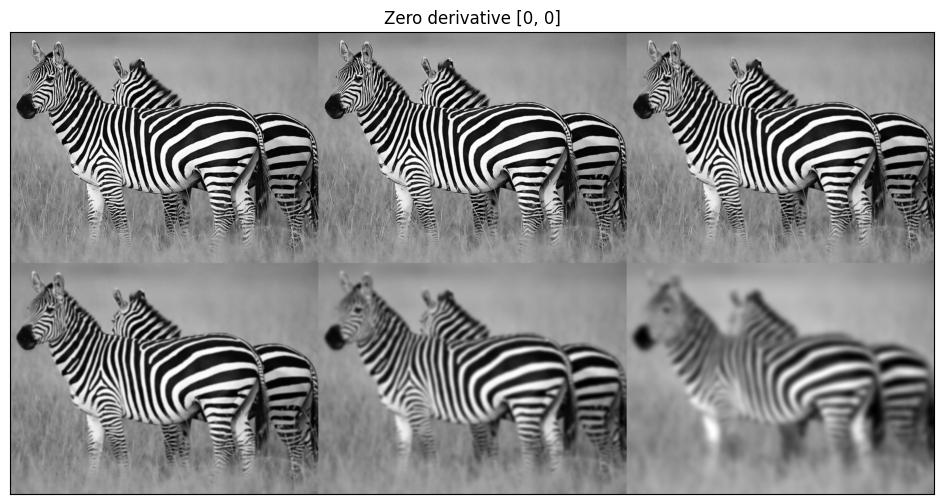

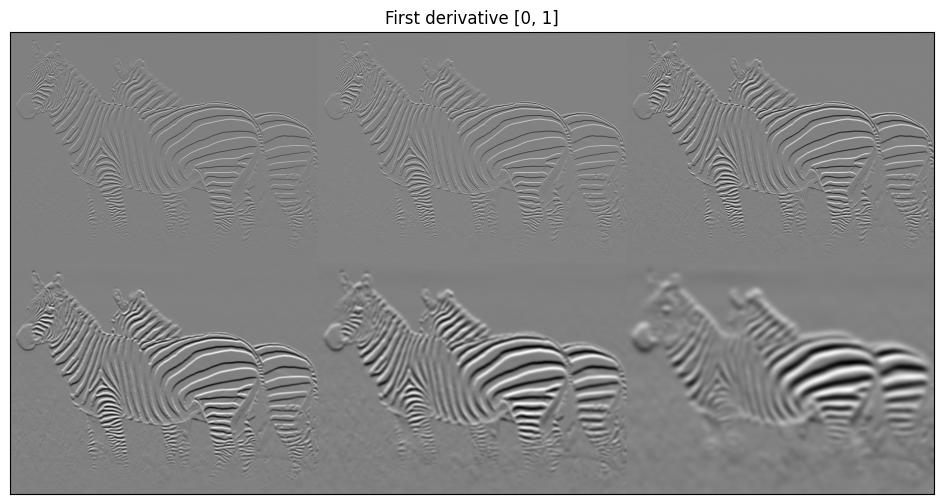

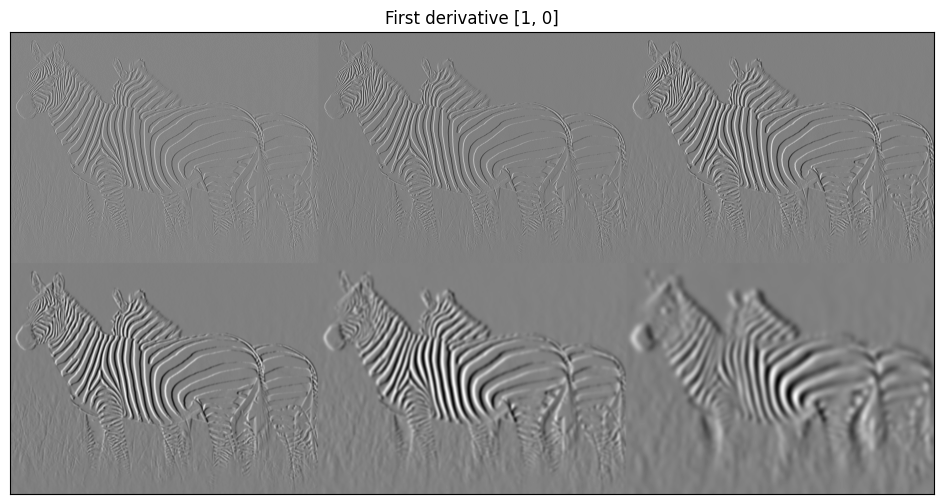

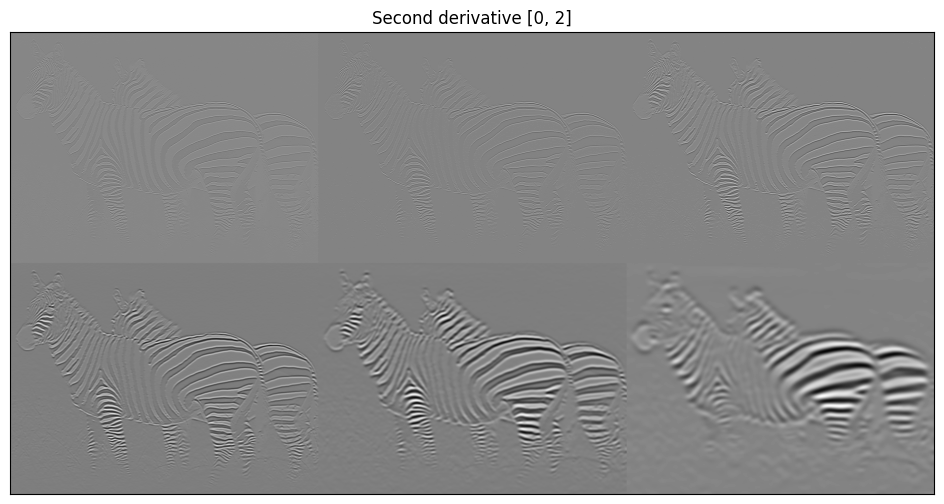

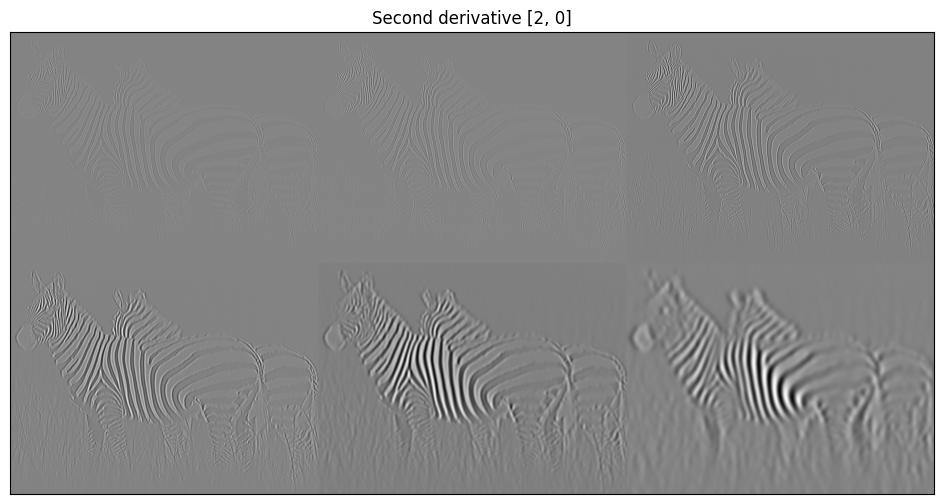

In [ ]:
def my2DConv(im, sigma, orders):
  if orders == [0, 0]: # Suavizado Gaussiano
    return cv2.sepFilter2D(im, -1, gaussianMask1D(sigma), gaussianMask1D(sigma))

  # Suavizado con derivadas verticalmente u horizontalmente
  elif orders in [[0, 1], [1, 0], [0, 2], [2, 0]]:
    mask_X = gaussianMask1D(sigma, order=orders[0])
    mask_Y = gaussianMask1D(sigma, order=orders[1])
    return cv2.sepFilter2D(im, cv2.CV_64F, mask_X, mask_Y)

  else:
    print(f'Error in order of derivative = {orders}')


sigmas = [0.75, 1, 2, 4, 8, 16]
im = readIm(get_image('zebra.jpg'), 0) # Se lee la imagen en escala de grises
orders_list = [[0, 0], [0, 1], [1, 0], [0, 2], [2, 0]]

for orders in orders_list:
  vim0 = []
  for sigma in sigmas:
    vim0.append(rangeDisplay01(my2DConv(im, sigma, orders), True))

  if 2 in orders:
    displayMI_ES(vim0,f"Second derivative {orders}")
  elif 1 in orders:
    displayMI_ES(vim0,f"First derivative {orders}")
  else:
    displayMI_ES(vim0,f"Zero derivative {orders}")

## C) (1 punto)

> *En este apartado hay que emplear la función de OpenCV `sepFilter2D()` con $\sigma=2.0$ para calcular y mostrar el gradiente (4 imágenes: derivada en $X$, derivada en $Y$, magnitud y orientación) y la Laplaciana de la Gaussiana. Se debe explicar el trabajo realizado, incluyendo las expresiones matemáticas subyacentes y el análisis, al igual que en todos los ejercicios, relativo a si los resultados obtenidos se corresponden con lo esperado.*

<p align="justify">
Aunque los resultados obtenidos para la derivada en X y la derivada en Y son los mismos que los obtenidos en sus respectivas imagenes del ejercicio anterior para un valor de $\sigma = 2$ vamos a explicar su funcionamiento:

<p align="justify">
La gradiente de una imagen es una medida de cambio de intensidad en esta. Basicamente, indica hacia que dirección varía la intensidad de los pixeles. Como vimos en teoría, si tenemos una imagen $f$, su gradiente está dado por el vector $∇f = [\frac{∂f}{∂x}, \frac{∂f}{∂y}]$, donde $\frac{∂f}{∂x}$ es la derivada en la direccion horizontal ($X$) y $\frac{∂f}{∂y}$ en la vertical ($Y$).

<br>

- **derX** : Este gradiente $[\frac{∂f}{∂x}, 0]$ se calcula midiendo el cambio de intensidad a lo largo del eje horizontal. Al igual que en el anterior ejercicio, hacemos una convolución usando la derivada horizontalmente y la Gaussiana verticalmente para obtener los resultados. Podemos observar que es correcta, ya que destaca las rayas del cuello y cuerpo de la cebra que están organizadas horizontalmente.

<br>

- **derY** : El gradiente $[0, \frac{∂f}{∂y}]$ mide el cambio de intensidad a lo largo del eje vertical. Es decir, hacemos una convolución usando la Gaussiana horizontalmente y la derivada verticalmente. Como se explicó en el anterior, esta destaca las rayas de la cebra que se organizan verticalemente como la de su parte trasera o las patas.

<br>

- **Magnitud** : La magnitud del gradiente $\sqrt{(\frac{∂f}{∂x})^2 + (\frac{∂f}{∂y}})^2$ indica que tan fuerte es el cambio de intensidad en cualquier dirección de la imagen, es decir, usandola detectaremos los bordes existentes en la imagen ya que valores altos de la magnitud corresponden a transiciones bruscas en la imagen.
La razon por la que en la imagen solo se aprecian colores blanco y negros es porque la magnitud del gradiente solo mide la intensidad del cambio, sin información de color. Esto significa que los valores altos de la magnitud (transiciones bruscas) se representan en blanco, mientras que los valores bajos (áreas sin cambios) se muestran en negro.
En este caso, las líneas blancas que vemos corresponden a las zonas donde la intensidad cambia rápidamente, es decir como las rayas de la cebra o el contorno de las mismas. Entonces, las líneas se detectan al identificar las zonas de alta magnitud, lo que indica que en esos puntos hay bordes. Las transiciones suaves o sin cambio en la intensidad generan valores bajos en la magnitud, lo cual aparece en negro, como en el fondo de la imagen donde no hay bordes claros.

<br>

- **Orientación** : Tenemos que la dirección de la gradiente es $𝜃 = \tan^{-1}(\frac{∂f}{∂x} / \frac{∂f}{∂y})$, esto muestra hacia donde apunta el cambio de intensidad en la imagen. Por ello en la imagen, las áreas con tonos similares tienen orientaciones de gradientes similares. Además, las rayas se ven resaltadas con distintos tonos ya que cada borde tiene una orientación distinta según la dirección del cambio de intensidad en esa área. Los tonos reflejan cómo cambia la dirección en las trasnsiciones de intensidad en toda la imagen.

<br>

- **Laplacina** : La laplaciana escrita como $\frac{∂^2f}{∂x^2} + \frac{∂^2f}{∂y^2}$, nos permite también encontrar zonas en la imagen donde se encuentran cambios de forma brusca (bordes), resaltando y aumentando la visibilidad de detalles permitiendo identificar claramente los contornos y texturas. Como resalta las áreas donde la intensidad de la imagen cambia significativamente, hace que las partes más claras y oscuras se contrasten más entre sí. Sin embargo, esto causa que las zonas de bajo contraste se vean más grises, ya que el filtro puede amplificar el ruido de la imagen.
Este filtro, se suele combinar con el filtro Gaussiano, ya que al suavizar la imagen se difuminan las variaciones rápidas e irrelevantes en la intensidad de la imagen, lo que permite que la laplaciana se concentre más en los cambios significativos de la estructura y los bordes. Mejorando así la efectividad de la detección de bordes y texturas a la vez que disminuye la amplificación del ruido, resultando en una imagen más clara y precisa.
Al aplicar la segunda derivada con respecto a $X$ o $Y$, se detectaba bien las rayas horizontales o verticales respectivamente, pero las del otro sentido no destacaban. Por eso sumando la una con la otra, ese problema se elimina permitiendonos así detectar bordes en ambos sentidos.

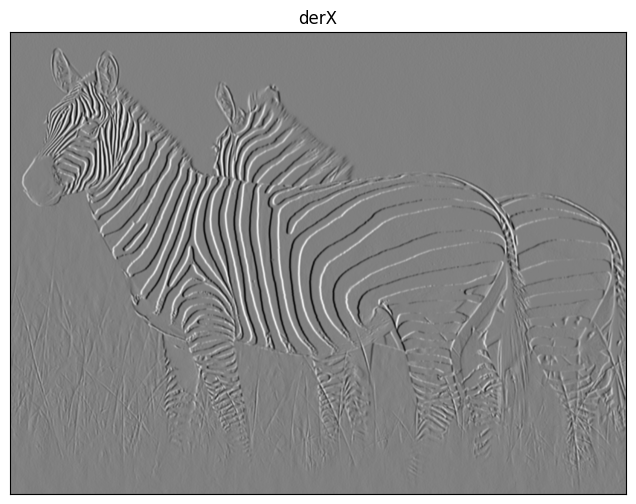

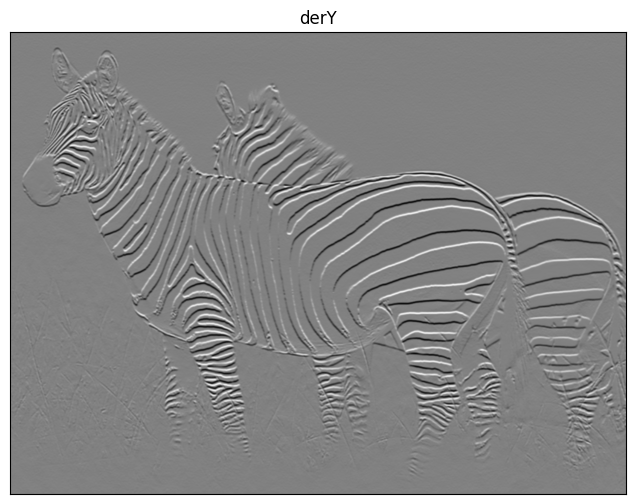

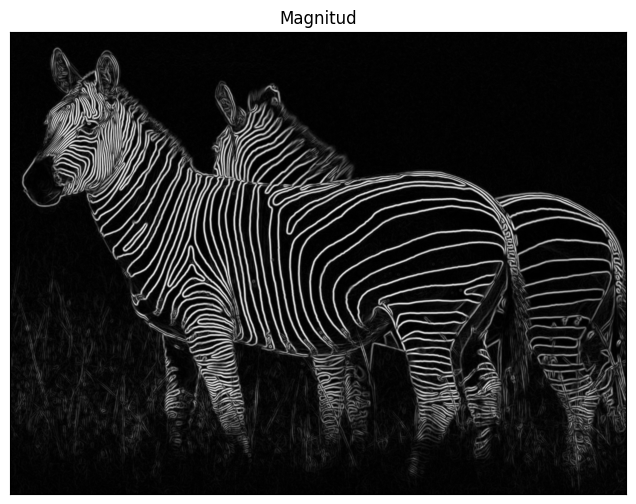

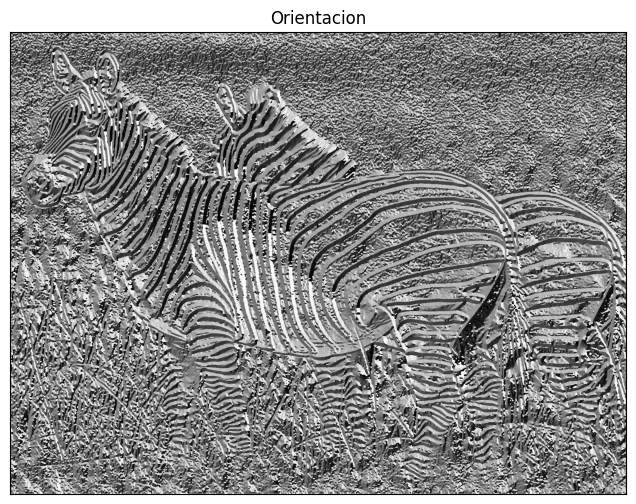

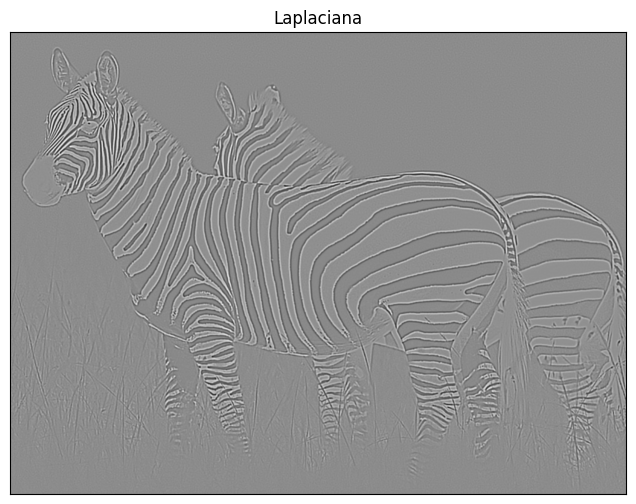

In [ ]:
# Aplicar el filtro 2D con la primera derivada, horizontal y verticalmente
def gradientIM(im,sigma):
  mask = gaussianMask1D(sigma)
  mask_1d = gaussianMask1D(sigma, order=1)
  dx = cv2.sepFilter2D(im, cv2.CV_64F, mask_1d, mask)
  dy = cv2.sepFilter2D(im, cv2.CV_64F, mask, mask_1d)
  return dx,dy

# Aplicar el filtro 2D con la segunda derivada, horizontal y verticalmente
# Luego hacer el cálculo final para sigma teniendo estos 2
def laplacianG(im,sigma):
  mask = gaussianMask1D(sigma)
  mask_2d = gaussianMask1D(sigma, order=2)
  dxx = cv2.sepFilter2D(im, cv2.CV_64F, mask_2d, mask)
  dyy = cv2.sepFilter2D(im, cv2.CV_64F, mask, mask_2d)
  return (dxx + dyy) * (sigma**2)

# Obtenemos las derivadas horizontal y vertical y luego calculamos la magnitud
dx, dy = gradientIM(im, 2.0)
magnitude = np.sqrt(dx**2 + dy**2)
orientation = np.arctan2(dy, dx)

# Mostramos las imágenes
displayIm(dx, title='derX')
displayIm(dy, title='derY')
displayIm(magnitude, title='Magnitud')
displayIm(orientation, title='Orientacion')

# Mostramos la Laplaciana
displayIm(laplacianG(im, 2.0), title='Laplaciana')

## D) (1.5 puntos)

>*Implemente una función para realizar "a mano" la convolución separable (es decir, empleando kernels 1D). Dicha función debe recibir como entrada una imagen (con el _padding_ adecuado, en caso de que lo necesite, ya incorporado) y un kernel 1D, y debe proporcionar como salida la imagen convolucionada con el kernel en ambas direcciones*.

> *Una vez haya implementado la función, realice el suavizado de la imagen `motorcycle.bmp` (usando un _Gaussian kernel size_ de 7, y dejando que sea la propia función de creación del kernel la que determine el $\sigma$ adecuado), y compare el resultado con el de `cv2.GaussianBlur` (en donde se debe optar por la misma estrategia: fijando $ksize=7$ y dejando que sea la propia función de OpenCV la que escoja el sigma). ¿Hay diferencias (sea a nivel de resultado final o de tiempo de ejecución)? En caso afirmativo, ¿a qué se pueden deber?*

<p align="justify">
Basicamente la convolución 1D que hago "a mano", alarga el kernel para convertirlo en un array bidimensional de tantas columnas como la imagen pasada tenga. De la forma que si tengo un kernel [1,2,1] y una imagen de por ejemplo 4 columnas (incluyendo padding) se transformará en [ [1,1,1,1] [2,2,2,2] ,[1,1,1,1] ].</p>

<p align="justify">
Simplemente se recorre cada fila de la imagen (empezando y terminando por las filas que no son unicamente de paddings) y cada una la multiplico por el array bidimensional mostrado realizandolo a lo largo de las columnas. Es decir, pongamos que estamos en la primera fila y primera columna de la imagen, por ello cogemos los valores correspondientes por arriba y por abajo multiplicandolo por cada valor del kernel, donde el elemento central de este será el del pixel actual.</p>

<p align="justify">
Finalmente, para la convolución 2D, añado a la imagen el padding, es decir rellenar con 0 por todos los lados para que la operacion del kernel en los valores centrales se haga correctamente y luego se ejecuta la funcion 1D dos veces, uno pasandole el kernel normal a la imagen, y el siguiente usando la traspuesta de esta para que salga correctamente el resultado si queremos hacer el mismo proceso dos veces.</p>

In [ ]:
def convolve1D(image, kernel):
    kernel_2d = np.repeat(kernel[:, np.newaxis], image.shape[1], axis=1) #axis=1, repetición a lo largo de las filas.
    padding = len(kernel) // 2

    # Convolución por columnas
    output = np.zeros_like(image)
    for i in range(padding, image.shape[0] - padding):
      # Extraer la ventana que corresponde a la fila "i" y las filas adyacentes
      ventana = image[i - padding : i + padding+1, :]
      output[i, :] = np.sum(kernel_2d * ventana, axis=0) # axis=0, la suma se realiza a lo largo de las columnas,

    return output


def convolve2D(image, kx, ky):
  if (len(kx) % 2 == 0) or (len(ky) % 2 == 0):
    print("Error: Los kernel deben ser impares")
    return None

  # Calculamos el tamaño de padding y lo añadimos a la imagen
  padding = len(kx) // 2
  image = np.pad(image, ((padding, padding), (padding, padding)), mode='constant', constant_values=0)

  image = convolve1D(image, kx)
  return convolve1D(image.T,ky)[padding:-padding, padding:-padding].T # Quitamos el padding al devolver

En la imagen de abajo tenemos una gráfica de los distintos tiempos de ejecución de cada función. Podemos observar que `GaussianBlur` tarda considerablemente menos que nuestra función creada `convolve2D` (la primera vez que se ejecute GaussianBlur tomará mas tiempo que convolve2D por el echo de inicializar los recursos y optimizar la caché, luego si se ejecuta mas veces siempre tarda menos).
Esta diferencia es debido simplemente a que la biblioteca OpenCV está muy optimizada para operaciones de procesamiento de imágenes, por lo que es normal que utilizando memoria y algoritmos eficientes y la paralelización, se acelere el proceso mucho mas que en mi función creada.

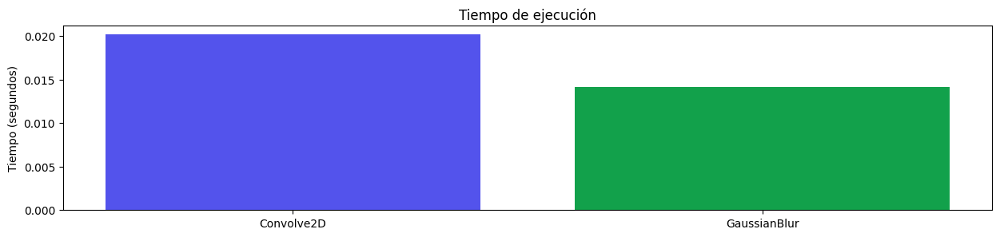

In [ ]:
im  = readIm(get_image('motorcycle.bmp'), 0) # Se lee la imagen en escala de grises

kernel = gaussianMask1D(sizeMask=7)

start_time = time.time()
convolve2d = convolve2D(im, kernel, kernel)
time_convolve2d = time.time() - start_time

start_time = time.time()
gaussianBlur = cv2.GaussianBlur(src=im, ksize=(7,7), sigmaX=-1)
time_gaussianBlur = time.time() - start_time

# Graficamos los tiempos
operations = ['Convolve2D', 'GaussianBlur']
times = [time_convolve2d, time_gaussianBlur]
plt.bar(operations, times, color=['#5353ec', '#12a14b'])
plt.ylabel('Tiempo (segundos)')
plt.title('Tiempo de ejecución')
plt.show()

<p align="justify">
Finalmente, podemos concluir que OpenCV prioriza la rapidez y la eficiencia en el procesamiento de imágenes en lugar de la precisión de los resultados. Por esta razón, aunque nuestra función manual requiera significativamente más tiempo de ejecución, proporciona resultados más precisos lo que hace valiosa en situaciones donde la precisión es fundamental.
Por esta razón, los algoritmos de OpenCV están optimizados para ser rápidos, pero pueden no ser los mejores para tareas que requieren un alto nivel de detalle y precisión visual.

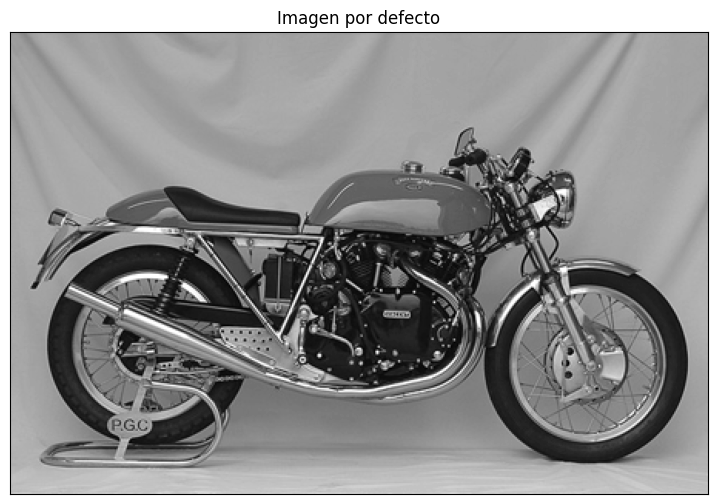

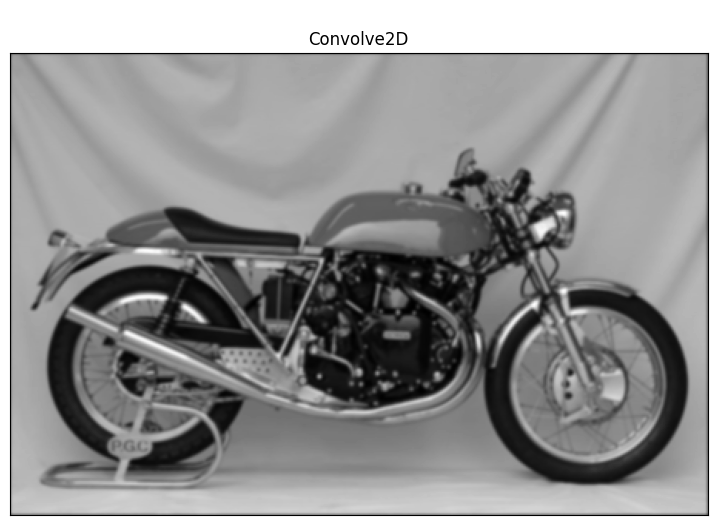

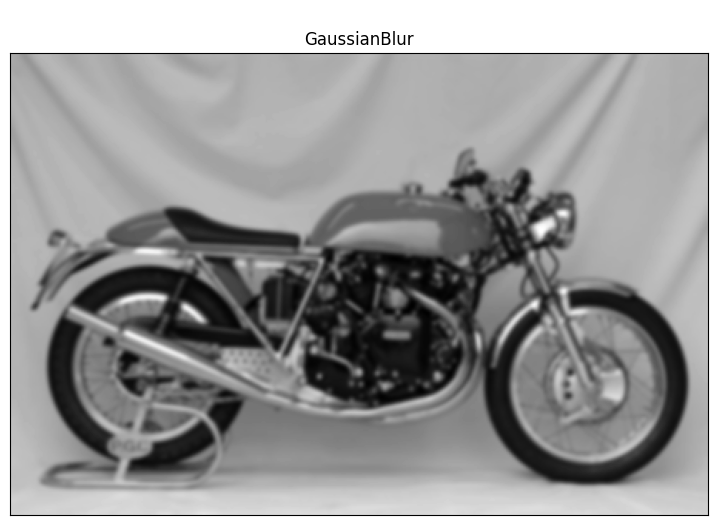

In [ ]:
# Mostramos las imágenes
displayIm(im, title="Imagen por defecto")
displayIm(convolve2d, title="\nConvolve2D")
displayIm(gaussianBlur, title="\nGaussianBlur")

## E) (0.5 puntos)

> *Las herramientas de IA generativa son de gran utilidad tanto para estudiantes como para docentes. No obstante, resulta fundamental tener una actitud crítica y asumir desde el principio que las respuestas proporcionadas por estas herramientas pueden ser factualmente incorrectas (véase,  por ejemplo, https://elpais.com/tecnologia/2024-09-25/los-nuevos-modelos-de-ia-como-chatgpt-persiguen-la-superinteligencia-pero-no-logran-ser-fiables-ni-en-preguntas-bobas.html). En este sentido, vale la pena recordar lo que indica la guía de la UGR (https://ceprud.ugr.es/formacion-tic/inteligencia-artificial): _"Debes revisar siempre la salida que genera y las posibles referencias que utilice. [...] Mejora tus resultados con la IAGen aprendiendo a usarla y a comunicarte con ella de manera adecuada. Pero no dejes que piense por ti."_*

>*En este apartado trabajaremos de forma crítica la utilidad de estas herramientas. Para ello, el alumnado debe emplear ChatGPT (https://chatgpt.com/) para consultar _"en qué consiste y para qué sirve la normalización de escala, así como por qué, en dicha normalización de escala, se multiplica por $\sigma^n$, siendo $n$ el orden de derivada"_. No se trata meramente de copiar lo que indique ChatGPT como salida, sino de analizar y matizar su respuesta, confrontándola con otras lecturas y lo que el estudiante sabe de la teoría, indicando en qué aspectos dicha respuesta puede considerarse correcta y en qué aspectos quizás no lo es.*

**Respuesta de ChatGPT**

---
"La normalización de escala ajusta los valores de una función o señal para que tengan un rango específico, facilitando su análisis y comparación. En el contexto de derivadas, especialmente en filtros o transformadas, se multiplica por
$𝜎^n$  (donde
𝑛
es el orden de derivada) porque las derivadas de orden superior tienden a aumentar su magnitud. Esto asegura que la normalización conserve la consistencia en la escala a medida que se elevan los órdenes de derivada, evitando que las amplitudes se descontrolen o se vuelvan inestables."

**Análisis de la misma**

---
<p align="justify">
Como hemos estudiado, la normalización de escala trata de ajustar nuestro conjunto de datos a un rango de valores comparable, por ejemplo el ya usado [0 - 1]. De esta forma nos aseguramos que los datos se distribuyan de manera equilibrada, evitando que alguna variable con una magnitud mucho mayor domine el análisis. De esta forma mejoramos su visualizacion y rendimiento de los modelos. Por lo tanto, aunque la respuesta de ChatGPT es correcta, es bastante general y carece de detalles específicos. Donde como primera respuesta falta mucho que explicar.</p>

<br>

<p align="justify">
Por otra parte, como expliqué en el ejercicio 1A, la primera y segunda derivada deben multiplicarse por $\sigma^1$ y $\sigma^2$ respectivamente para mantener el rango de valores constante siempre. Podemos intuir que cuanto mayor sea el valor de $\sigma$, más apalanada se vuelve la derivada de la función gaussiana acercándose los valores a 0, o lo que es lo mismo, los píxeles cercanos van a tomar menos importancia (de ahí los picos de las derivadas), y cuanto mas importancia pierdan menos sensible se hará a cambios bruscos de intensidad (situación tipica de los bordes). Para evitar que la primera derivada sufra cambios de sensibilidad muy notable en funcion del $\sigma$ usaremos esta normalización, lo que permite que los valores  se mantengan contantes en diferentes escalas. Así, se evita que las derivadas para valores grandes de $\sigma$ tiendan a ser demasiado pequeñas, asegurando que el cambio de intensidad de los vecinos mas próximos predominen sobre el resto. Entonces la respuesta de ChatGPT vuelve a ser la misma que lo dicho en el anterior párrafo, aunque es correcta ya que como dice :"*las derivadas de orden superior tienden a aumentar su magnitud. Esto asegura que la normalización conserve la consistencia...*". Le falta mencionar muchos puntos claves, como puede ser el por que hace falta esta constancia y que lo provoca. Además, omite detalles importantes como las razones detrás de este aumento en la magnitud y la importancia de mantener la constancia en la sensibilidad frente a diferentes valores de $\sigma$.</p>

<br>

<p align="justify">
En conclusión, ChatGPT debería haber profundizado más en por qué es necesario normalizar y cómo esta normalización evita que los detalles importantes, como los bordes, se pierdan o se vuelvan inestables cuando se usan diferentes escalas de $\sigma$. Ya que como primer vistazo deja mucho que desear y aunque nos da una pequeña idea, no es lo suficientemente clara como para poder trabajar con ella.

# **Ejercicio 2**:  Pirámides Gaussianas y Laplacianas (3.5 puntos)







## A) (1.5 puntos)

>*Construya una pirámide Gaussiana de 4 niveles empleando máscaras Gaussianas de tamaño $7\times7$. No se permite emplear las funciones `pyrUp()` y `pyrDown()` de OpenCV, ni tampoco `cv2.resize()`.*

<p align="justify">
La pirámide Gaussiana básicamente consiste en partir de una imagen y reducir su resolución en varios niveles, creando  sucesivamente versiones más pequeñas y suavizadas de la imagen original.</p>

<p align="justify">
Para constuir nuestra piramide Gaussiana de 4 niveles de manera "manual" sin usar las funciones mencionadas: a la imagen actual le aplicamos un suavizado mediante una convolución 2D con un kernel Gaussiano de 7x7. Esto lo hago para suavizar la imagen y eliminar detalles finos antes de reducir su resolución.</p>

<p align="justify">
Es importante hacerlo ya que este previene el "aliasing" y asegura que la reducción de resolución sea más precisa, manteniendo las características más importantes de la imagen en cada nivel de la pirámide. Ya que por ejemplo como se vio en teoría en la imagen de cuadros blancos y negros, si no tratamos el "aliasing", se acabaría generando una imagen difusa con patrones grises al reducir la resolución.</p>

<p align="justify">
Luego a cada imagen, le reducimos la resolución haciendo un submuestreo de  cada segundo píxel en ambas dimensiones. Este proceso se repite en cada iteración, generando versiones más pequeñas y suavizadas de la imagen original, hasta completar los 4 niveles de la pirámide.
</p>

In [ ]:
'''
This function displays a pyramid of images, providing as input the list of images to display.

Example of use:
im1=readIm(get_image('apple.jpg'),1)
images = [im1, cv2.resize(im1,(im1.shape[0]//2,im1.shape[1]//2),cv2.INTER_LINEAR), cv2.resize(im1,(im1.shape[0]//4,im1.shape[1]//4),cv2.INTER_LINEAR), cv2.resize(im1,(im1.shape[0]//8,im1.shape[1]//8),cv2.INTER_LINEAR), cv2.resize(im1,(im1.shape[0]//16,im1.shape[1]//16),cv2.INTER_LINEAR)]

displayPyramid(images, title='Piramide de Manzanas')

'''
def displayPyramid(vim, title='result'):
  temp = np.zeros_like(vim[0])
  if np.mod(temp.shape[1],2)==0:
    h = temp[:, :temp.shape[1]//2]
  else:
    h = temp[:, :(temp.shape[1]//2)+1]
  out = np.hstack((temp, h))
  top = 0
  out[0:vim[0].shape[0], 0:vim[0].shape[1]] = vim[0]
  left = vim[0].shape[1]
  for i in range(1, len(vim)):
    out[top:top+vim[i].shape[0], left:left + vim[i].shape[1]] = vim[i]
    top += vim[i].shape[0]
  displayIm(out, title)

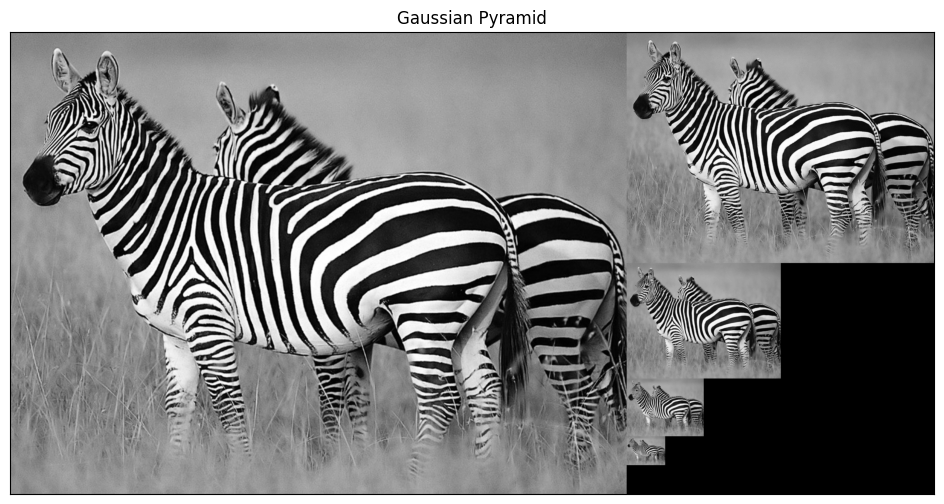

In [ ]:
def pyramidGauss(im,sizeMask=7, nlevel=4, smooth=True):
  pyrG = [im]
  kernel = gaussianMask1D(sizeMask=sizeMask)

  for i in range(nlevel):
    if smooth:
      im = cv2.sepFilter2D(im, cv2.CV_64F, kernel, kernel)
    im = im[0::2, 0::2]  # Submuestreo de la imagen
    pyrG.append(im)

  return pyrG

im  = readIm(get_image('zebra.jpg'), 0) # Se lee la imagen en escala de grises
pyrG = pyramidGauss(im,sizeMask=7, nlevel=4)
displayPyramid(pyrG,'Gaussian Pyramid')

## B) (1 punto)

>*Use su código del apartado anterior para implementar una función que permita construir una pirámide Laplaciana de 4 niveles.*

<p align="justify">
Tal y como se dice en las diapositivas de teoría, para obtener la pirámide Laplaciana debemos partir de la imagen mas pequeña de la pirámide Gaussiana, y expandirla al tamaño de la siguiente imagen mas grande, como esto lo realizamos mediante interporlación se obtendrá una versión suavizada de la imagen original.
Luego a la siguiente imagen mas grande, le restamos la expandida para obtener la imagen laplaciana correspondiente a la imagen actual. Y así hasta que recorramos todos los niveles.

<br>

<p align="justify">
La razón de este cálculo es que queremos capturar los detalles que se perdieron al suavizar y reducir la imagen. Al restar la versión suavizada (expandida) de la imagen original, obtenemos una imagen que resalta los bordes y detalles finos que se eliminaron durante el suavizado.

<p align="justify">
Un aspecto importante antes de visualizar la imagen es que si la mostramos tal cual, aparecerá con tonos muy oscuros, mas de lo normal. Esto se debe a que el cálculo produce valores de píxeles que pueden ser negativos o muy pequeños en comparación con los valores originales de la imagen. Esto significa que la imagen resultante puede tener un rango de valores que no se ajusta bien a la escala de 0 a 255, por ejemplo -125.
Por ello es indispensable normalizar los valores en un rango de 0 a 1, redistribuyendo asi los valores correctamente. Esto mejora la visibilidad de los detalles en la imagen y asegura que todos los valores se representen adecuadamente en la escala correcta.

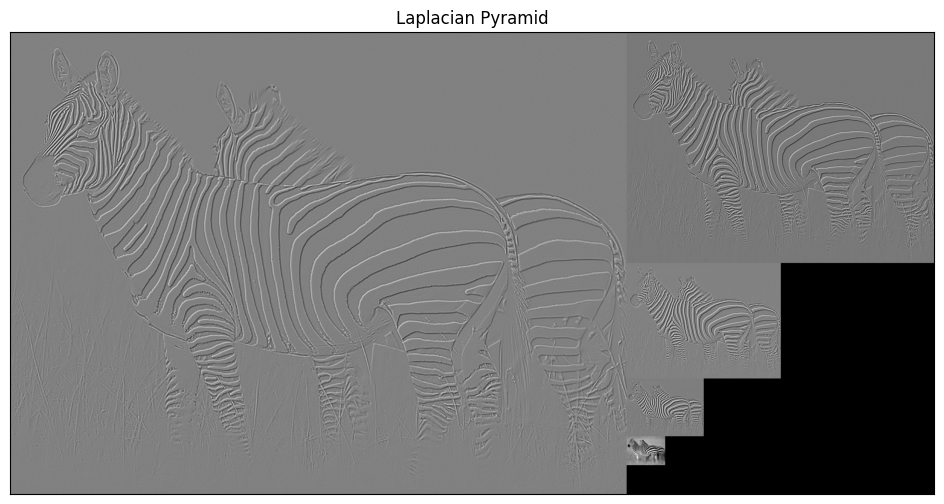

In [ ]:
def pyramidLap(im, sizeMask, nlevel=4,flagInterp=cv2.INTER_LINEAR, smooth=True):
  pyrG = pyramidGauss(im,sizeMask, nlevel, smooth)
  pyrG = [im.astype(np.float32) for im in pyrG]
  pyL = []

  # Expandir y realizar el calculo para cada nivel
  for i in range(nlevel):
    expanded = cv2.resize(pyrG[i+1], (pyrG[i].shape[1], pyrG[i].shape[0]), interpolation=flagInterp)
    pyL.append(pyrG[i] - expanded)

  pyL.append(pyrG[-1])
  return pyL

# Mostrar la pirámide
pyL = pyramidLap(im,sizeMask=7, smooth=True)
pyL = [rangeDisplay01(pyLimage) for pyLimage in pyL]
displayPyramid(pyL,'Laplacian Pyramid')

## C) (0.5 puntos)

>*Ahora realice la misma operación que en los apartados anteriores, pero sin suavizar antes de hacer subsampling a la hora de crear la pirámide Gaussiana. ¿Hay diferencias visuales en la pirámide Laplaciana generada? ¿A qué se pueden deber estas?*

<p align="justify">
Cuando creamos una pirámide laplaciana a partir de una imagen, es importante aplicar un suavizado con un filtro gaussiano antes de reducir la resolución como se explicó en el primer ejercicio. Si omitimos este paso, la imagen resultante en las escalas más pequeñas se vuelve ruidosa y presentará bordes marcados, especialmente en áreas de alta frecuencia, como en las distintivas rayas de la cebra. Esto ocurre porque el submuestreo sin suavizado capta detalles que no deberían estar presentes, generando partes visuales que empeoran la calidad de la imagen. En lugar de ofrecer una representación clara, la imagen se ve deformada.
</p>

<br>

<p align="justify">
Al suavizar la imagen antes de submuestrearla, eliminamos esas frecuencias y logramos que la pirámide laplaciana conserve mejor los detalles relevantes de la imagen original evitando el "aliasing". Sin este suavizado se pierde la calidad visual. En estos casos, es importante que las frecuencias se representen con precisión, y con un buen suavizado garantizamos que se mantenga la esencia de la imagen sin que el ruido y las irregularidades aparezcan en ella.


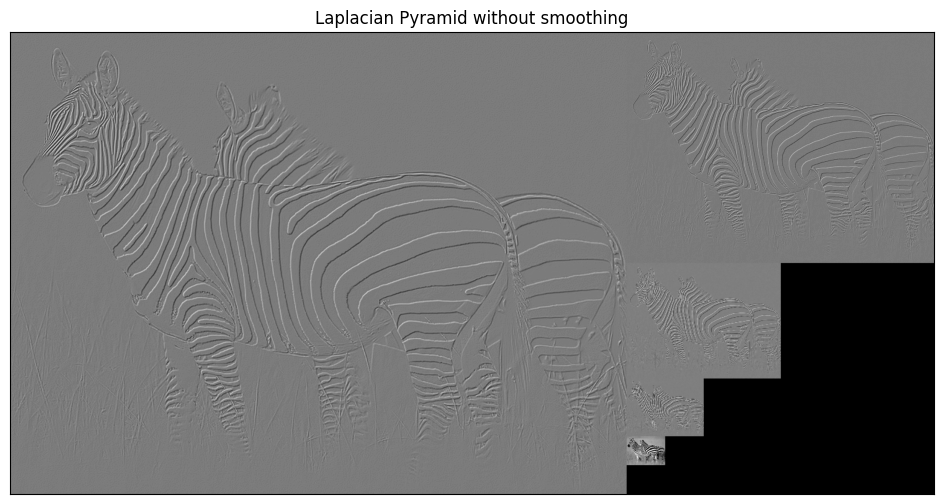

In [ ]:
pyL = pyramidLap(im, sizeMask=7, smooth=False)
pyL = [cv2.normalize(pyLimage, None, 0, 255, cv2.NORM_MINMAX) for pyLimage in pyL]
displayPyramid(pyL,'Laplacian Pyramid without smoothing')

## D) (0.5 puntos)

>*Implemente ahora una función para reconstruir la imagen codificada en la pirámide Laplaciana del apartado 2.B. Verifique que es posible obtener una copia exacta de la imagen original. Para ello, calcule el error de reconstrucción como el _Root Mean Squared Error_ (RMSE) entre los niveles de intensidad de la imagen original y la imagen reconstruida.*

<p align="justify">
Para la reconstrucción de una imagen, tenemos que partir de la piramide laplaciana. Al igual que para crear esta, debemor partir de la imagen mas pequeña y expandirla al tamaño de la siguiente imagen mas grande (actual en cada iteración del bucle). Esta expansión se realiza mediante interpolación, que permite estimar valores intermedios entre los píxeles.Finalmente debemos hacer la suma de la imagen laplaciana actual y la expandida. De la misma forma, como puede existir valores fuera del rango habitual, debemos normalizarla.

<br>

<p align="justify">
Al sumar la imagen expandida con la imagen Laplaciana actual, estamos fusionando los detalles de alta frecuencia, que representan cambios bruscos en la intensidad de los píxeles (como bordes y texturas), con la información suavizada de la imagen de fondo. Este proceso permite restaurar las características importantes de la imagen original al integrar estos detalles finos con la estructura general. Y como podemos ver en la reconstrucción final, se obtiene una imagen idéntica a la original con un error por pixel de 0.0.</p>


<br>

Tener en cuenta que el **teorema de muestreo de Nyquist-Shannon explica por qué la reconstrucción es precisa independientemente del sigma aplicado**. Después del suavizado, los píxeles redundantes pueden ser descartados sin perder información, ya que tenemos una versión reducida de la imagen original y todos los detalles (altas frecuencias) en diferentes escalas. Esto asegura que toda la información necesaria para la reconstrucción esté presente, garantizando una imagen final idéntica a la original.


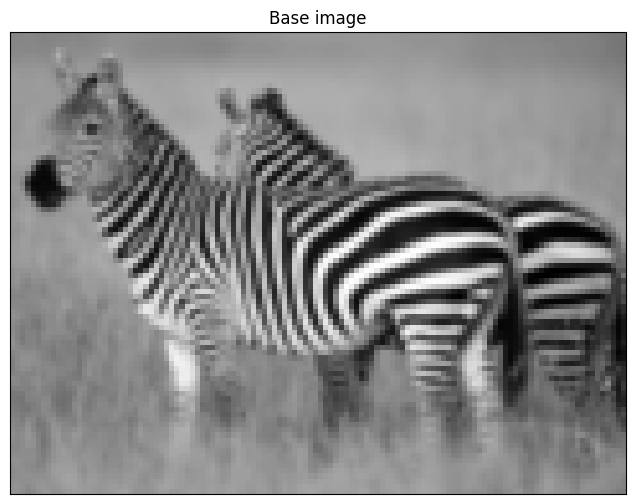

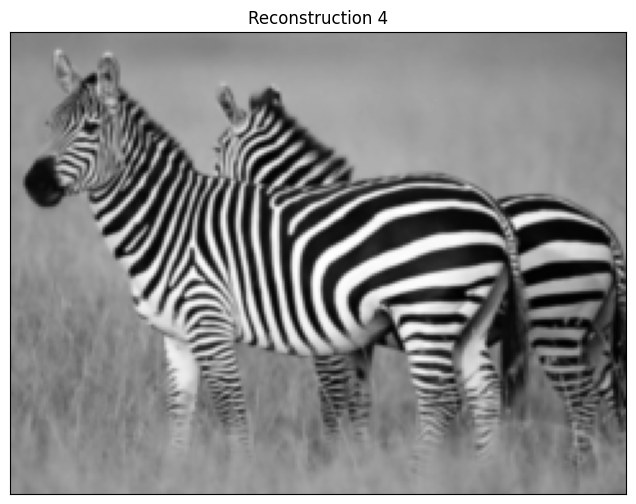

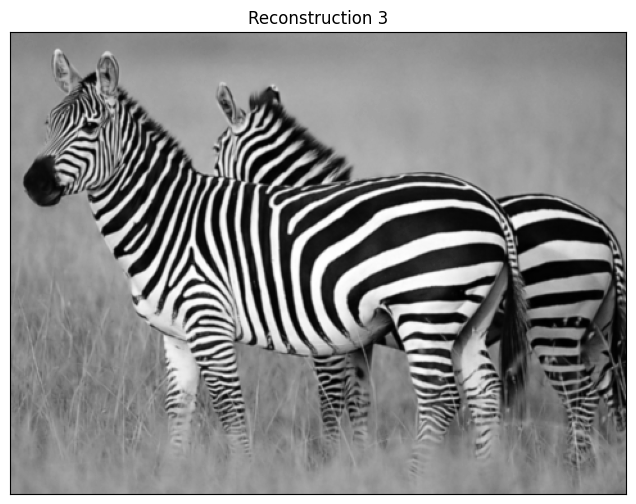

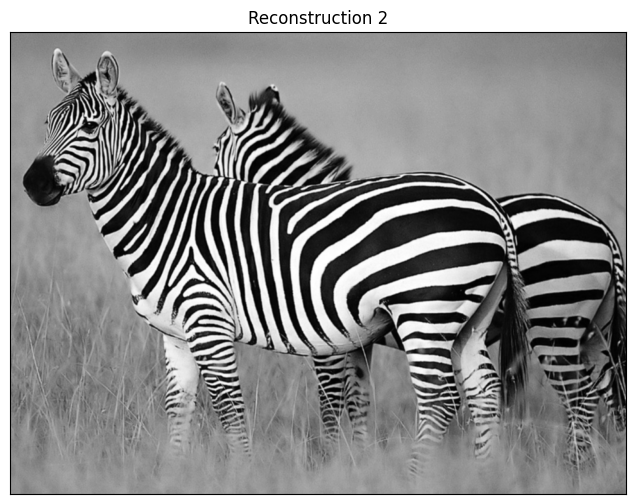

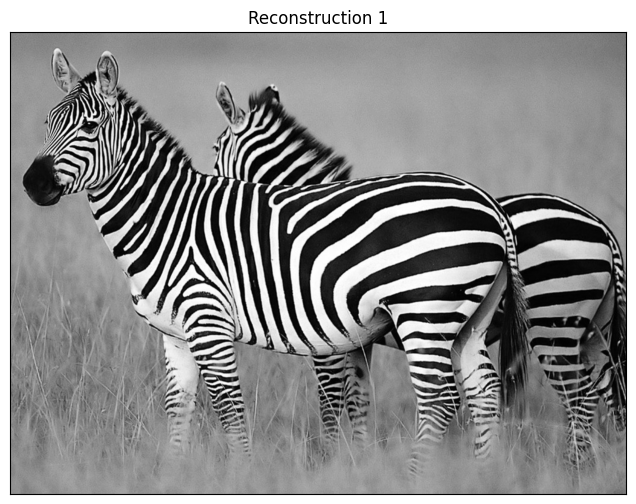

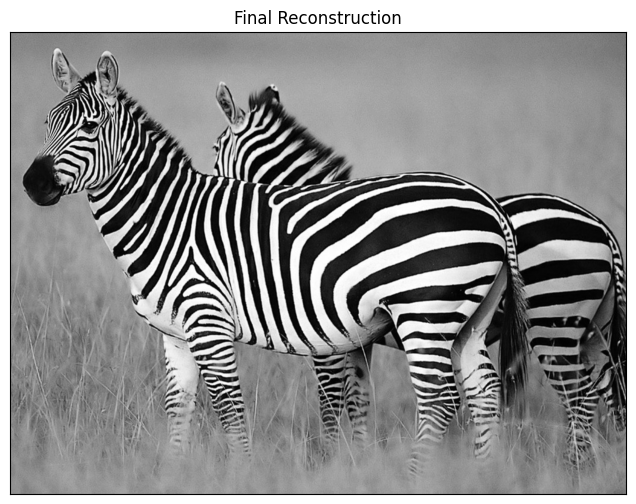

Error per pixel 0.0


In [ ]:
def reconstructLap(pyL, flagInterp):
    # Comenzar desde el último nivel de la pirámide Laplaciana
    im = pyL[-1]
    displayIm(rangeDisplay01(im), title="Base image")

    # Recorrer la pirámide en orden inverso
    for i in range(len(pyL)-2, -1, -1):
      expanded = cv2.resize(im, (pyL[i].shape[1], pyL[i].shape[0]), interpolation=flagInterp)
      im = pyL[i] + expanded
      displayIm(rangeDisplay01(im), title=f"Reconstruction {i+1}")

    return im


pyL = pyramidLap(im, sizeMask=7)
recons = reconstructLap(pyL, flagInterp = cv2.INTER_LINEAR)
displayIm(rangeDisplay01(recons), title="Final Reconstruction")
print('Error per pixel',np.sqrt(np.mean((im - np.round(recons)) ** 2)))

# **Ejercicio 3: Imágenes Híbridas** (1.5 puntos)

>*Este ejercicio se basa en el siguiente trabajo: $\textit{Oliva, A., Torralba, A., & Schyns, P. G. (2006). Hybrid images. ACM Transactions on Graphics (TOG), 25(3), 527-532}$ (https://stanford.edu/class/ee367/reading/OlivaTorralb_Hybrid_Siggraph06.pdf). Vamos a aprender cómo el sistema visual humano extrae información sobre un objeto en función de la distancia. Para ello, construimos una imagen híbrida a partir de dos imágenes de objetos diferentes. Mezclando adecuadamente parte de las altas frecuencias de una imagen con parte de las bajas frecuencias de otra imagen, obtenemos una imagen híbrida que muestra diferentes percepciones con la distancia. El sigma empleado para filtrar ambas imágenes (tanto la de alta como la de bajas frecuencias) es el aspecto clave para seleccionar el rango de frecuencias altas y bajas de cada imagen. Cuanto mayor sea el valor sigma, mayor será la eliminación de altas frecuencias de la imagen. Se recomienda elegir este valor por separado para cada una de las imágenes y, de hecho, seguramente sea posible (y deseable) el tener distintos valores para distintos pares de imágenes.*

>*Aspectos de importancia en relación a este ejercicio:*
1. *Como mínimo, se deben generar las imágenes híbridas correspondientes a `'cat.bmp'+'dog.bmp'`, `'submarine.bmp'+'fish.bmp'` y `'marilyn.bmp'+'einstein.bmp'` (todas ellas en escala de grises). Se debe emplear una pirámide Gaussiana con 5 niveles para mostrar el efecto obtenido.*
2. *No es necesario seguir al pie de la letra el artículo de referencia y operar en el dominio de la frecuencia (Fourier). Basta con operar en el dominio del espacio, como hemos hecho en todos los demás apartados de esta práctica.*
3. *Se debe explicar con claridad el criterio empleado para escoger la imagen de altas y la imagen de bajas frecuencias, así como el proceso seguido para filtrar la imagen de altas frecuencias y la de bajas frecuencias (incluyendo la elección de los sigmas finalmente utilizados; es decir, no sería suficiente indicar sucintamente que "se procedió por medio de prueba y error hasta obtener el sigma final").*

<p align="justify">
Las imágenes híbridas son combinaciones visuales que contienen dos imágenes diferentes manipulando sus frecuencias espaciales: las bajas y las altas. En este proceso, las bajas frecuencias (que corresponden a la imagen de contornos suaves) predominan en la lejanía, mientras que las altas frecuencias (correspondientes a detalles finos) destacan de cerca.  En otras palabras, al ver las imágenes, notamos una figura distinta según la proximidad; al estar cerca, los detalles finos de las altas frecuencias dominan, mientras que al alejarnos, los contornos difusos de las bajas frecuencias son los únicos visibles.</p>

<br>

<p align="justify">
Para formar una, se comienza eligiendo dos imágenes: una para mantener sus altas frecuencias y otra para sus bajas frecuencias. La imagen de altas frecuencias será la que contenga mayor cantidad de detalles. Para estas, aplicaremos un high-pass-filter para conservar solo sus altas frecuencias, y un filtro de low-pass-filter a la otra, obteniendo solo sus bajas frecuencias. Al combinar estos resultados, se obtiene una imagen final que cambia su percepción con la distancia desde la que se observa.
El sentido de esto es que al ver de cerca, el ojo capta las altas frecuencias, mostrando la imagen detallada. Al alejarse, los detalles se pierden, y el ojo percibe solo las bajas frecuencias, destacando la imagen de contornos. Así, una misma imagen se interpreta de formas distintas según la proximidad, jugando con las frecuencias espaciales para ofrecer una doble lectura visual. </p>

<p align="justify">
Primero de todo con la siguiente función, vamos a averiguar a cual de las dos imagenes pasadas se le aplicará el high-pass-filter y a cual un low-pass-filter. Para lograr esto, se aplica la transformada discreta de Fourier, que convierte la imagen del dominio espacial al dominio de frecuencias. Esta transformación permite identificar las frecuencias horizontales y verticales que componen la imagen, proporcionando un conjunto de coeficientes de Fourier que contienen información sobre la amplitud y la fase de cada frecuencia.

<p align="justify">
A continuación, se calcula la magnitud de las frecuencias y se establece un umbral centrado en el origen para eliminar las bajas frecuencias, conservando solo las altas. Este umbral se define como un cuadrado cuyo centro es el origen, y al eliminar las frecuencias dentro de este cuadrado, obtendremos un conjunto de altas frecuencias. Y finalmente, se suma las magnitudes restantes para obtener una medida de la cantidad de detalles que aporta cada imagen en el dominio de frecuencias.

In [ ]:
def extraer_altas_frecuencias(im, umbral=30):
    # Transformada de Fourier desplazadando el origen al centro
    trans_f = np.fft.fftshift(np.fft.fft2(im))

    # Magnitud de cada frecuencia para medir su aportación a la imagen
    magnitudes_frecuencia = np.abs(trans_f)

    # Definir el tamaño de la máscara para conservar solo altas frecuencias
    alto, ancho = im.shape[0], im.shape[1]
    centro_alto, centro_ancho = alto // 2, ancho // 2
    mask = np.ones((alto, ancho), dtype=np.uint8)
    mask[centro_alto-umbral : centro_alto+umbral, centro_ancho-umbral : centro_ancho+umbral] = 0

    # Aplicar la máscara para eliminar frecuencias bajas y conservar solo altas
    altas_frecuencias = magnitudes_frecuencia * mask

    # Sumar la energía total de las altas frecuencias
    energia_altas = np.sum(altas_frecuencias)

    return energia_altas

Comparamos resultados obtenidos para ver que imagen posee mas altas frecuencias.

In [ ]:
def comparar_altas_frecuencias(name1, name2, umbral=30):
    imagen1 = cv2.imread(get_image(name1),0)
    imagen2 = cv2.imread(get_image(name2),0)

    # Obtener la energía de las altas frecuencias
    energia1 = extraer_altas_frecuencias(imagen1, umbral)
    energia2 = extraer_altas_frecuencias(imagen2, umbral)

   # Imprimir resultados
    print('-' * 50)
    print(f"{name1:<15} {energia1:<20}")
    print(f"{name2:<15} {energia2:<20}")

    mayor_energia = name1 if (energia1 > energia2) else name2
    print(f"* La imagen con más altas frecuencias es '{mayor_energia}'")
    print('-' * 50, "\n")

comparar_altas_frecuencias("cat.bmp", "dog.bmp")
comparar_altas_frecuencias("submarine.bmp", "fish.bmp")
comparar_altas_frecuencias("marilyn.bmp", "einstein.bmp")

--------------------------------------------------
cat.bmp         271130655.1091181   
dog.bmp         317580108.54126155  
* La imagen con más altas frecuencias es 'dog.bmp'
-------------------------------------------------- 

--------------------------------------------------
submarine.bmp   74271723.92253847   
fish.bmp        197159105.83366656  
* La imagen con más altas frecuencias es 'fish.bmp'
-------------------------------------------------- 

--------------------------------------------------
marilyn.bmp     101751296.94885404  
einstein.bmp    181210876.9765244   
* La imagen con más altas frecuencias es 'einstein.bmp'
-------------------------------------------------- 



La función `hybrid_image` crea una imagen híbrida combinando dos imágenes: una se utiliza para extraer las bajas frecuencias mediante un filtro gaussiano, mientras que a la otra se le restan las bajas frecuencias para obtener las altas. Al combinar las bajas frecuencias de la primera imagen con las altas de la segunda, se logra el resultado esperado (segun que sigma se aplique).

<br>

Necesitamos emplear un sigma distinto en cada filtro. Es importante ajustar bien este valor ya que es clave para balancear la cantidad de detalles que aporta cada imagen en una imagen híbrida. Un sigma alto en la imagen de bajas frecuencias elimina más detalles de esta, reduciendo la cantidad de frecuencias bajas que se mantienen. Por el contrario, un sigma elevado en la imagen de altas frecuencias deja pasar más detalles de la imagen de altas frecuencias, aumentando su aparición en el resultado final.
Es importante entender que un aumento en el sigma afecta directamente el equilibrio entre las dos imágenes. Cuando se ajusta este parámetro, se está priorizando la información de una imagen sobre la otra. Además, es fundamental tener en cuenta que **no existe un valor exacto de sigma que garantice el mejor resultado en todos los casos**. Variar este parámetro generará diferentes resultados, cada uno con su propio estilo y enfoque, por lo que mas adelante se ajustan distintos valores de sigma para cada imagen, viendo como el resultado varia y quedandonos con la combinación mas convincente.

In [ ]:
def hybrid_image(name1, name2, sigma1, sigma2):
  im1 = cv2.imread(get_image(name1),0)
  im2 = cv2.imread(get_image(name2),0)

  # Aplicamos el filtro gaussiano a las 2
  low_frequencies = cv2.sepFilter2D(im1, cv2.CV_64F, gaussianMask1D(sigma1), gaussianMask1D(sigma1))
  smoothed_im2  = cv2.sepFilter2D(im2, cv2.CV_64F, gaussianMask1D(sigma2), gaussianMask1D(sigma2))
  high_frequencies = im2 - smoothed_im2

  hybrid_image = low_frequencies + high_frequencies
  return pyramidGauss(hybrid_image, sizeMask=7, nlevel=5)

Ajustamos distintos sigmas para "cat" y "dog", vemos que el resultado mas convicente es con $\sigma_{cat}=6$  y  $\sigma_{dog}=6$

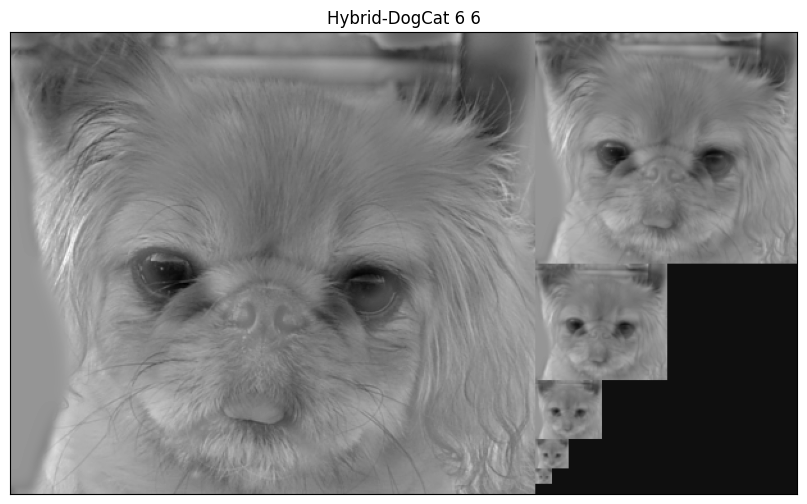

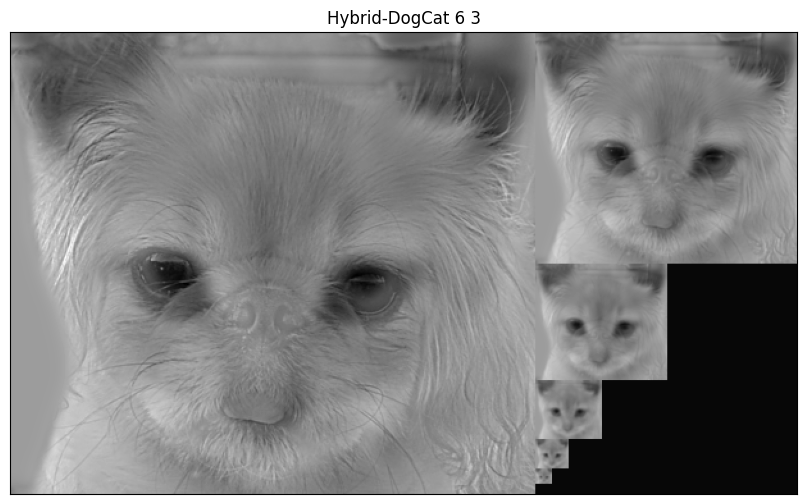

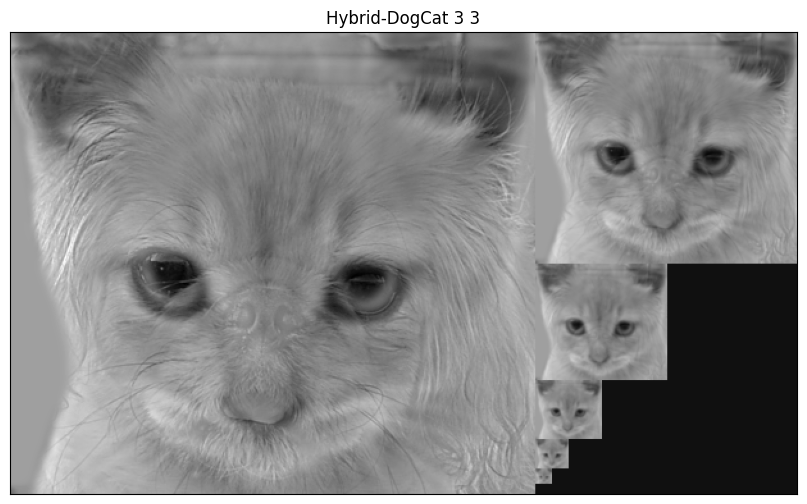

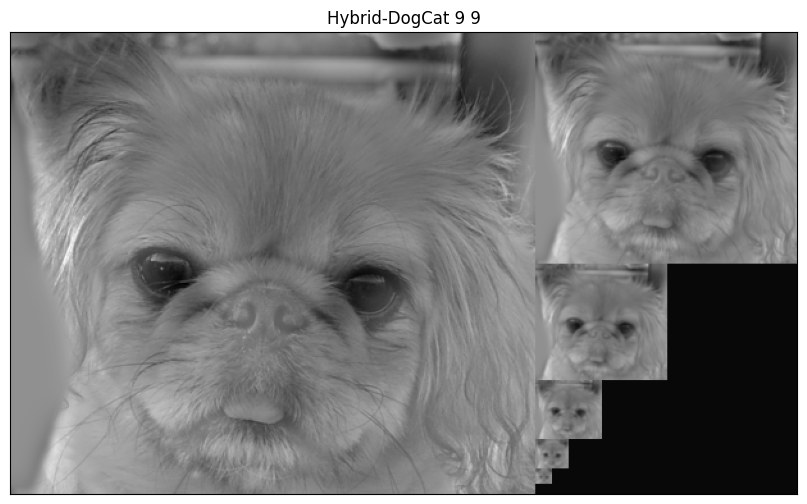

In [ ]:
displayPyramid(hybrid_image("cat.bmp", "dog.bmp", 6, 6),'Hybrid-DogCat 6 6')
displayPyramid(hybrid_image("cat.bmp", "dog.bmp", 6, 3),'Hybrid-DogCat 6 3')
displayPyramid(hybrid_image("cat.bmp", "dog.bmp", 3, 3),'Hybrid-DogCat 3 3')
displayPyramid(hybrid_image("cat.bmp", "dog.bmp", 9, 9),'Hybrid-DogCat 9 9')

Para "submarine" y "fish" nos quedaremos con los mismos sigmas que para el anterior, $\sigma=6$ para ambos.

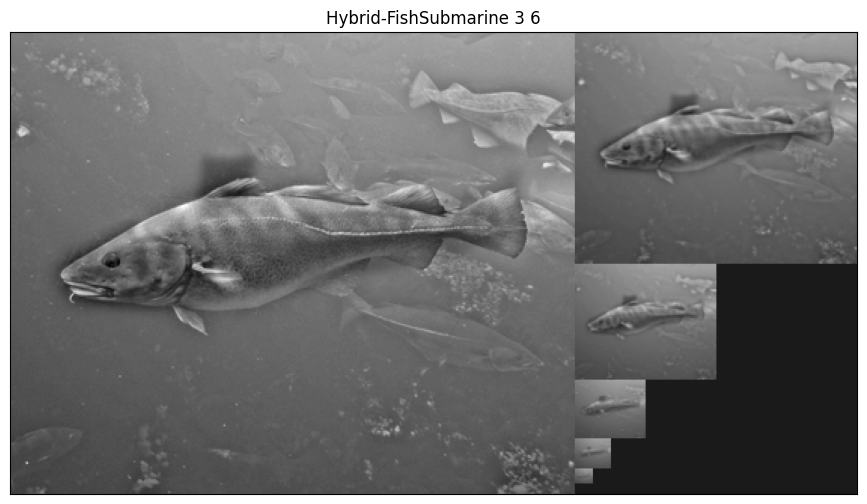

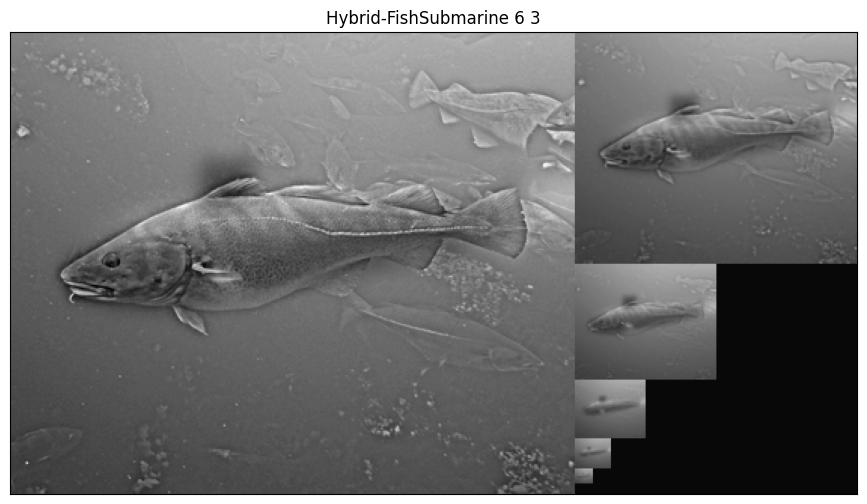

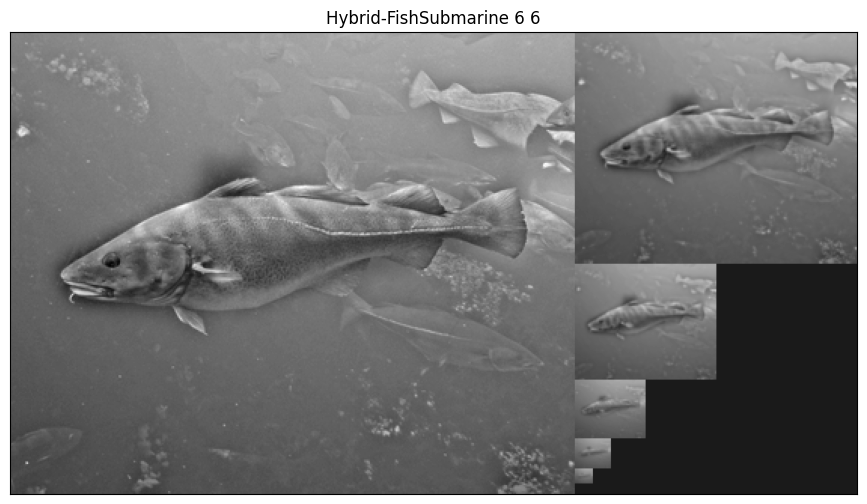

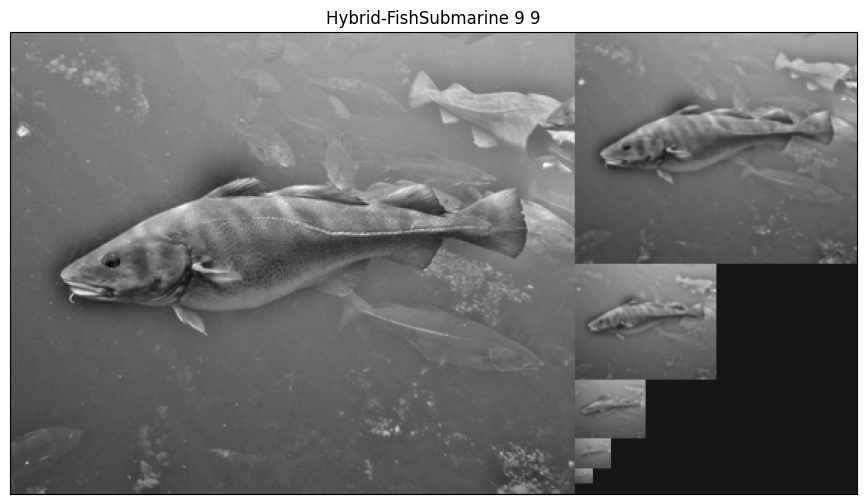

In [ ]:
displayPyramid(hybrid_image("submarine.bmp", "fish.bmp", 3, 6),'Hybrid-FishSubmarine 3 6')
displayPyramid(hybrid_image("submarine.bmp", "fish.bmp", 6, 3),'Hybrid-FishSubmarine 6 3')
displayPyramid(hybrid_image("submarine.bmp", "fish.bmp", 6, 6),'Hybrid-FishSubmarine 6 6')
displayPyramid(hybrid_image("submarine.bmp", "fish.bmp", 9, 9),'Hybrid-FishSubmarine 9 9')

Finalmente para "marilyn" y "einstein" usaremos para ambos $\sigma=4$.

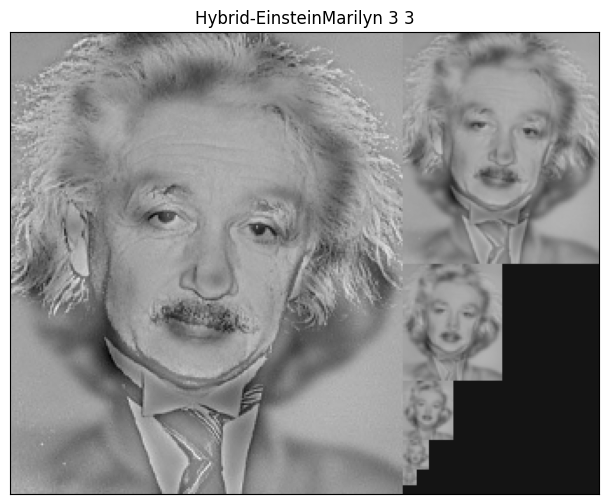

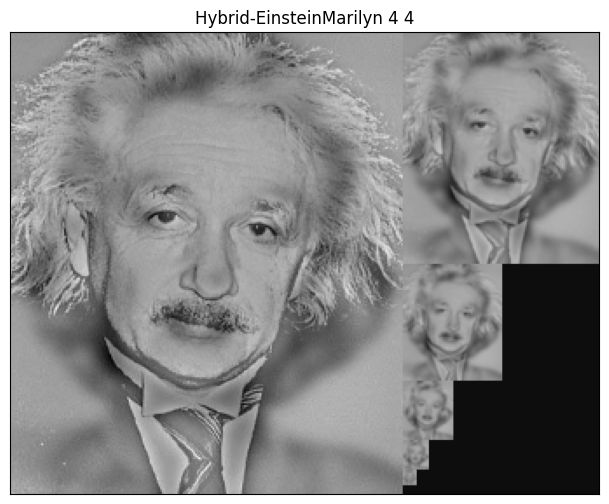

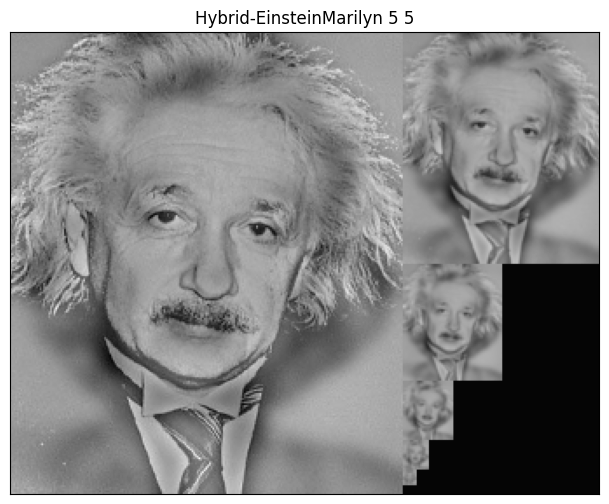

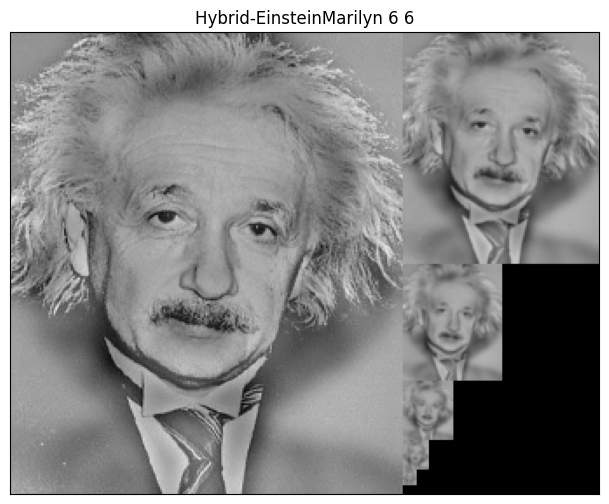

In [ ]:
displayPyramid(hybrid_image("marilyn.bmp", "einstein.bmp", 3, 3),'Hybrid-EinsteinMarilyn 3 3')
displayPyramid(hybrid_image("marilyn.bmp", "einstein.bmp", 4, 4),'Hybrid-EinsteinMarilyn 4 4')
displayPyramid(hybrid_image("marilyn.bmp", "einstein.bmp", 5, 5),'Hybrid-EinsteinMarilyn 5 5')
displayPyramid(hybrid_image("marilyn.bmp", "einstein.bmp", 6, 6),'Hybrid-EinsteinMarilyn 6 6')

Finalmente, plasmamos los resultados finales con los sigmas que hemos elegido.

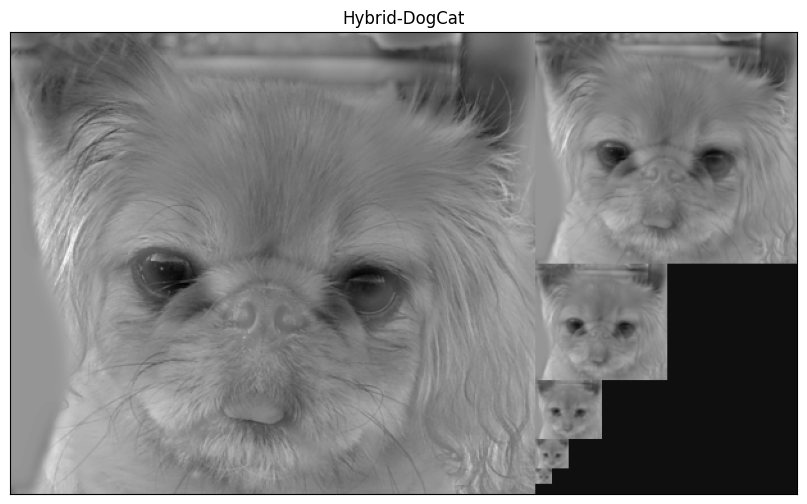

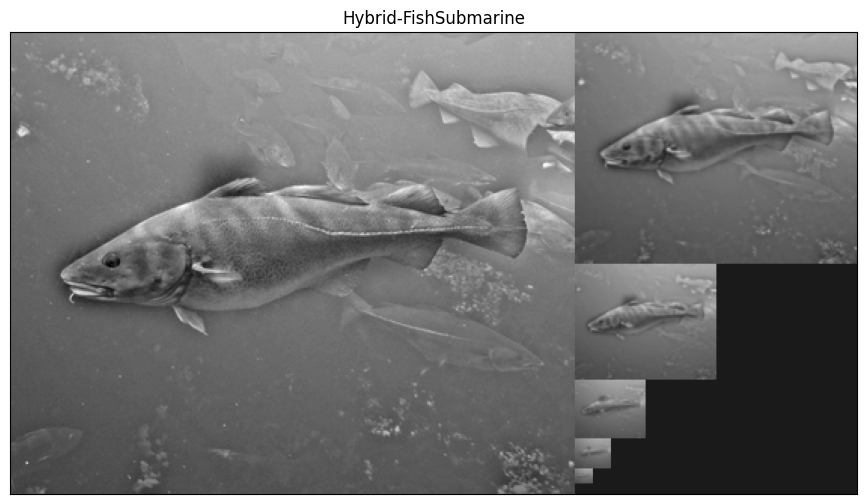

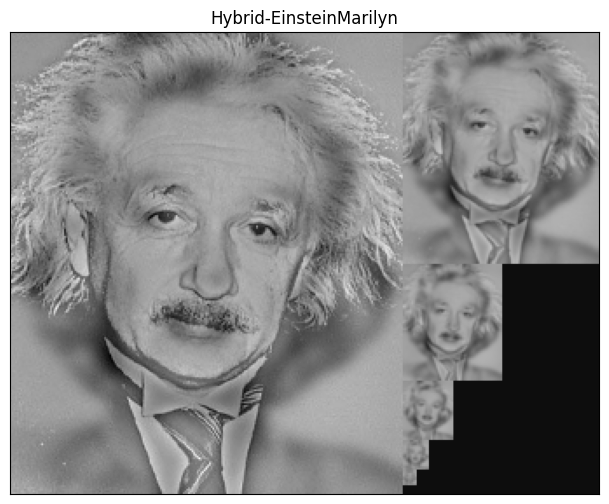

In [ ]:
# Generar imagenes hibridas gato y perro
hybrid_dog_cat = hybrid_image("cat.bmp", "dog.bmp", 6, 6)
displayPyramid(hybrid_dog_cat,'Hybrid-DogCat')

# Generar imagenes hibridas submarino y pez
hybrid_sub_fish = hybrid_image("submarine.bmp", "fish.bmp", 6, 6)
displayPyramid(hybrid_sub_fish,'Hybrid-FishSubmarine')

# Generar imagenes hibridas marilyn y einstein
hybrid_marilyn_einstein = hybrid_image("marilyn.bmp", "einstein.bmp", 4 ,4)
displayPyramid(hybrid_marilyn_einstein,'Hybrid-EinsteinMarilyn')

# **Ejercicio 4: Pyramid Blending** (1 punto)

>*En este ejercicio se debe crear la imagen fusionada de la manzana (`apple.jpg`; parte superior de la imagen fusionada final) y la naranja (`orange.jpg`; parte inferior de la imagen fusionada final) empleando la técnica de $\textit{Pyramid Blending}$. Para este ejercicio, si se desea, sí se pueden emplear las funciones de OpenCV `pyrDown` y `pyrUp`.*

>*Se debe:*
1. *explicar en detalle el proceso seguido a la hora de crear la nueva imagen (mezcla de ambas);*
2. *comparar el resultado con la combinación de las imágenes sin emplear _blending_, es decir, juntando directamente los píxeles de la mitad superior de una imagen con la mitad inferior de la otra;*
3. *mostrar los estados intermedios del procesado. Es decir, las pirámides Gaussianas calculadas para cada imagen (5 niveles cada una), las pirámides Laplacianas correspondientes, y los distintos niveles en que se va mezclando la imagen de salida (es decir, la reconstrucción en el nivel 1, la reconstrucción en el nivel 2,... y así sucesivamente hasta mostrar la imagen final reconstruida/_blended_).*



Antes de realizar cualquier operación, debemos fijarnos que ambas imagenes no tiene el mismo tamaño. Por eso vamos a quitarle filas y columnas a la imagen de mayor tamaño, en este caso `orange.jpg`, ajustandolo a las de `apple.jpg`.

Apple=(239, 238, 3), Orange=(240, 240, 3)

Reajustamos el tamaño
Apple=(239, 238, 3), Orange=(239, 238, 3)


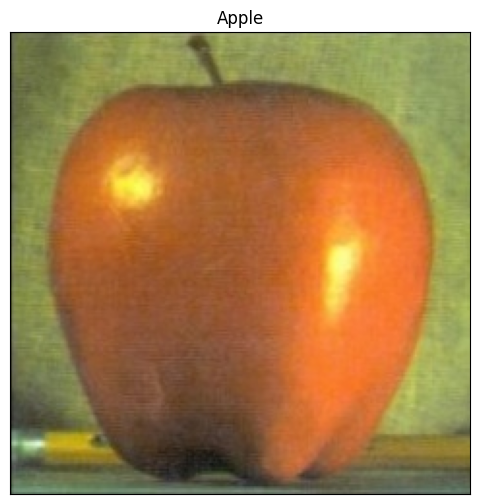

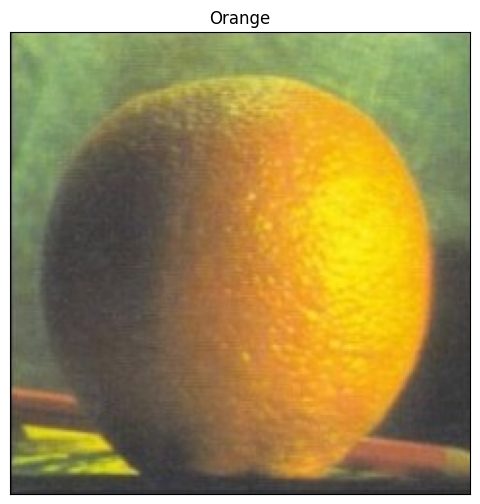

In [ ]:
# Cargar ambas imagenes
apple = readIm(get_image('apple.jpg'), 1)
orange = readIm(get_image('orange.jpg'), 1)
print(f"Apple={apple.shape}, Orange={orange.shape}")

# Ajustar 'orange' para que coincida con 'apple' en ambas dimensiones (altura y ancho)
orange = np.delete(np.delete(orange,[0], axis=0),[0,-1], axis=1)
print("\nReajustamos el tamaño")
print(f"Apple={apple.shape}, Orange={orange.shape}")
orange = orange[:apple.shape[0], :apple.shape[1]]

displayIm(apple, title="Apple")
displayIm(orange, title="Orange")

Generamos las piramides laplacianas de cada imagen. Como se explicó en anteriores ejercicios, para visualizarla debemos normalizarla antes.

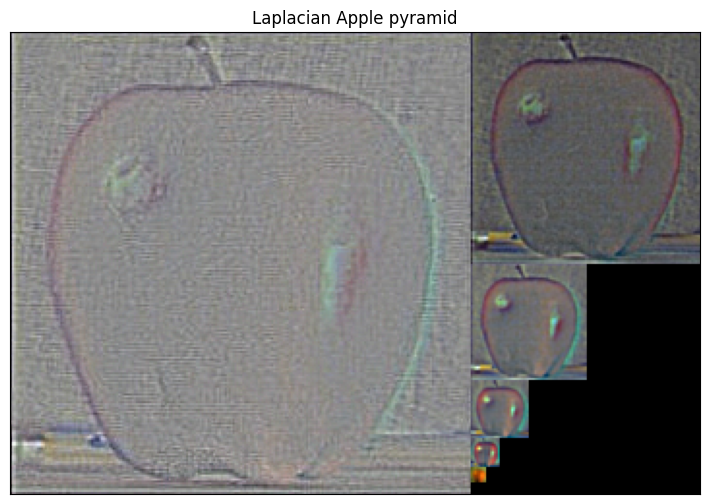

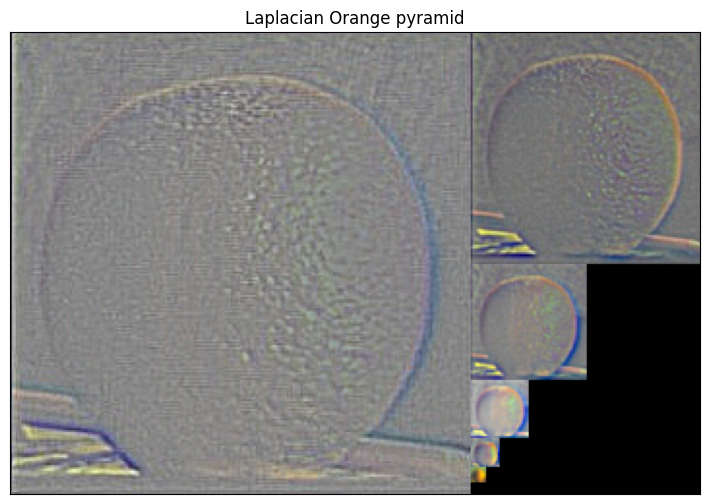

In [ ]:
# Generar las pirámides laplacianas
pyrL_apple = pyramidLap(apple, sizeMask=7, nlevel=5)
pyrL_apple_01 = [rangeDisplay01(pyrL_image) for pyrL_image in pyrL_apple]

pyrL_orange = pyramidLap(orange, sizeMask=7, nlevel=5)
pyrL_orange_01 = [rangeDisplay01(pyrL_image) for pyrL_image in pyrL_orange]

# Mostrar las laplacianas
displayPyramid(pyrL_apple_01,'Laplacian Apple pyramid')
displayPyramid(pyrL_orange_01,'Laplacian Orange pyramid')

<p align="justify">
Ahora es el momento de crear una máscara con el mismo tamaño de filas y columnas que las imagenes anteriormente mostradas. Pero queremos que la máscara esté "partida" para obtener la parte superior de la manzana e inferior de la naranja, para que luego puedan fusionarse.</p>

<p align="justify">
Esta máscara funcionará de tal manera que se dividirá en dos zonas, la mitad superior de esta se rellenará con 1's (píxeles blancos) y con 0's (píxeles negro) la mitad inferior de esta. Esto lo haremos ya que en la parte blanca se tomará una sección de la imagen (en este caso la manzana) y la parte inferior negra representará la sección que toma la otra.
Pero para que el corte entre la zona blanca y negra sea mas progresivo debemos suavizar relativamente mucho esta máscara. De esta manera, obtendremos un resultado mas natural, con un cambio entre imágenes mas progesivo.</p>

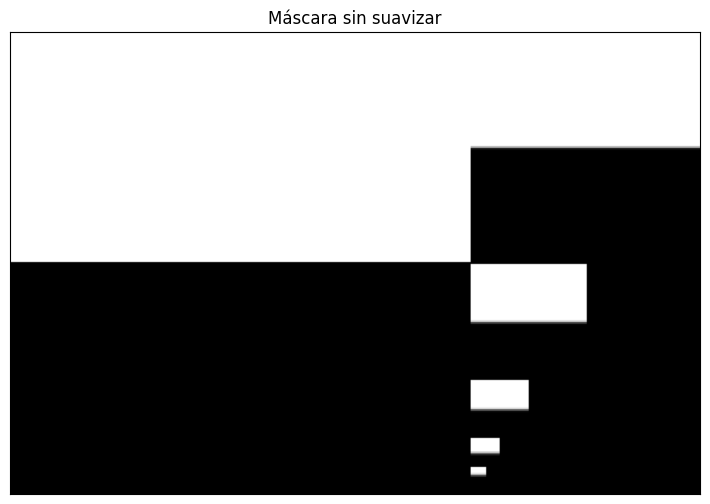

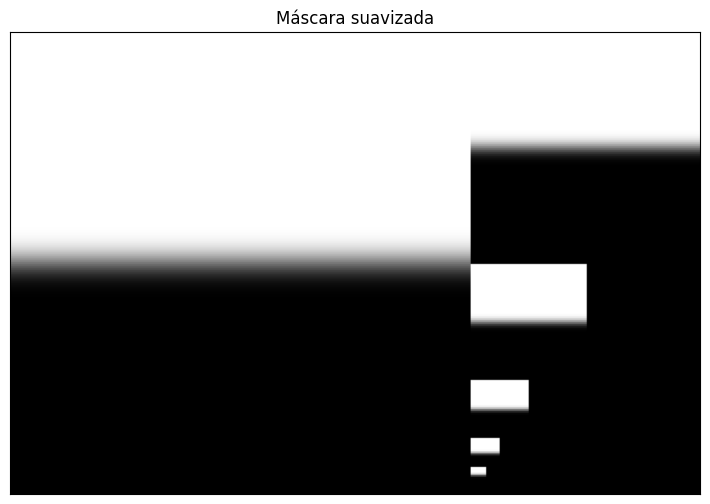

In [ ]:
# Creamos la máscara
mask = np.zeros((apple.shape[0], apple.shape[1]), dtype=np.float32)
mask[:int(apple.shape[0]/2), : ] = 1.0

pyrG_mask = pyramidGauss(mask, sizeMask=7, nlevel=5)
displayPyramid(pyrG_mask,'Máscara sin suavizar')

# Suavizamos ahora la máscara
mask_smooth = cv2.sepFilter2D(mask, -1, gaussianMask1D(sigma=7), gaussianMask1D(sigma=7))
pyrG_mask = pyramidGauss(mask_smooth, sizeMask=7, nlevel=5)
pyrG_mask = [rangeDisplay01(im) for im in pyrG_mask]
displayPyramid(pyrG_mask,'Máscara suavizada')

De esta forma en vez de un corte tan notable como se ve en las imágenes a continuación, obtendremos uno mucho mas suave y mas agradable a la vista con el que podemos ir trabajando.
Para ello hay que modificar la máscara para que cuente con los 3 canales de color (RGB) y obtener la combinación a traves de la fórmula explicada en teoria.

$L(i,j) = G_R(i,j) \cdot L_A(i,j) + (1 - G_R(i,j)) \cdot L_B(i,j)$

Donde $L_A$ y $L_B$ son las laplacianas de las dos imagenes, y $G_R$ la piramide Gaussiana de cada región.

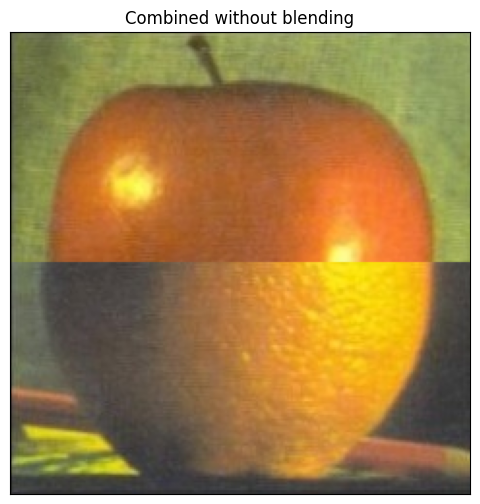

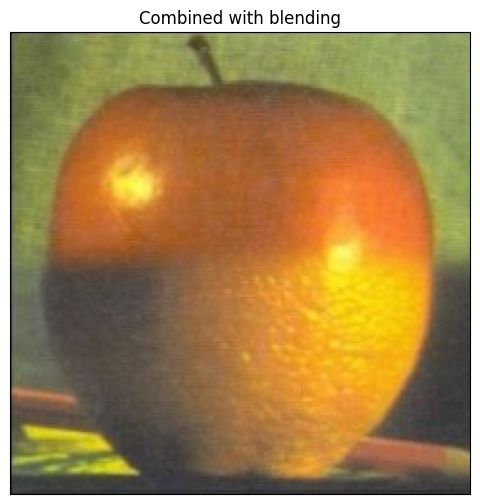

In [ ]:
# Mostramos la combinación de imagenes sin el blending
mask_rgb = np.dstack([mask] * 3)
combined_without_blending = mask_rgb * apple + (1 - mask_rgb) * orange
displayIm(rangeDisplay01(combined_without_blending), title="Combined without blending")

# Mostramos la combinación de imagenes sin el blending
mask_rgb = np.dstack([mask_smooth] * 3)
combined_without_blending = mask_rgb * apple + (1 - mask_rgb) * orange
displayIm(rangeDisplay01(combined_without_blending), title="Combined with blending")


Ahora simplemente calculamos la pirámide laplaciana de esta fusión inicial de las imágenes.

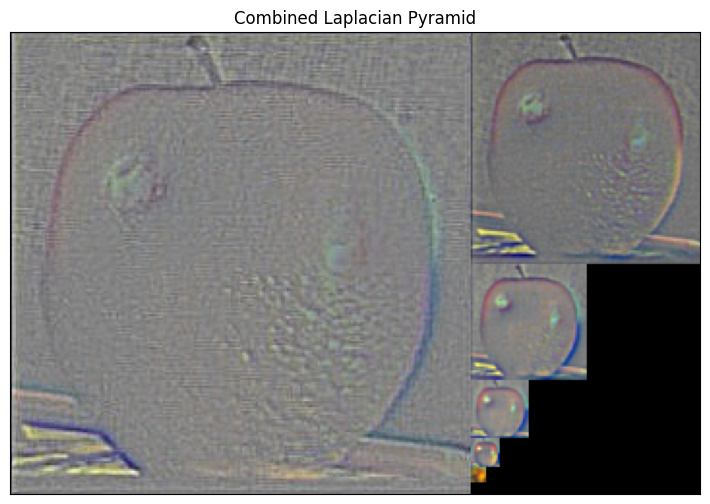

In [ ]:
combined_laplacian = []
for i in range(len(pyrL_apple)):
  mask_rgb = np.dstack([pyrG_mask[i]] * 3)
  combined = mask_rgb * pyrL_apple[i] + (1 - mask_rgb) * pyrL_orange[i]
  combined_laplacian.append(combined)

combined_piramid = [rangeDisplay01(laplacian_image) for laplacian_image in combined_laplacian]
displayPyramid(combined_piramid,'Combined Laplacian Pyramid')

Y ya finalmente, realizamos la reconstrucción a partir de la pirámide laplaciana mostrada. Donde podemos observar que gracias a este suavizado que se ha realizado inicialmente, el cambio de una imágen a otra aunque es perceptible, es mucho mas suave que si no lo hubieramos usado.

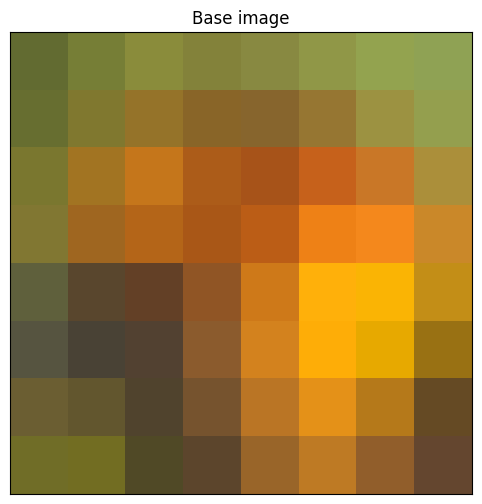

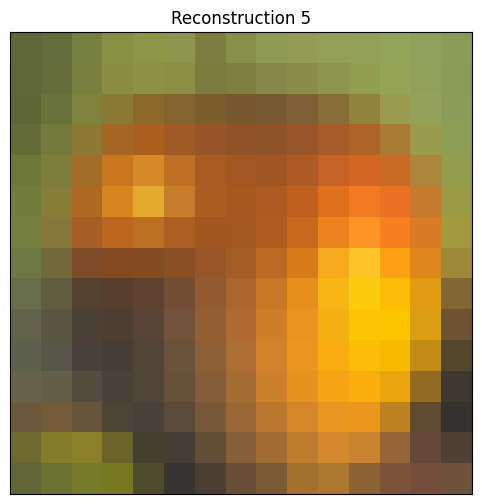

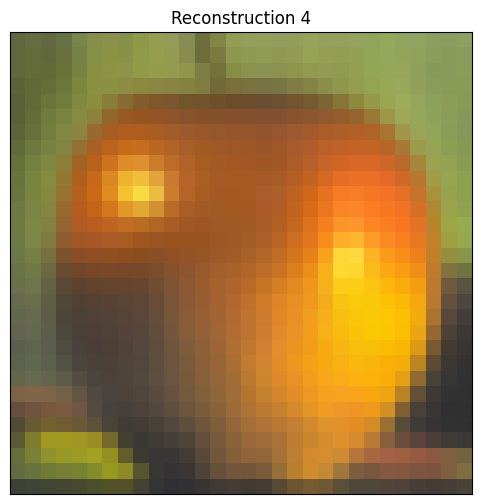

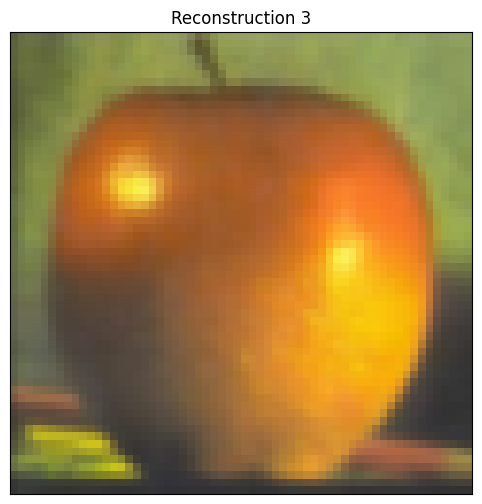

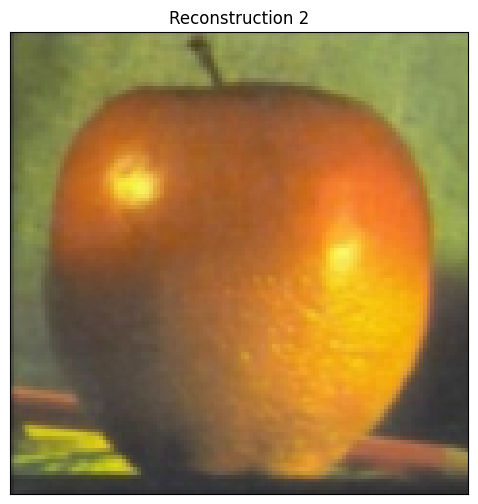

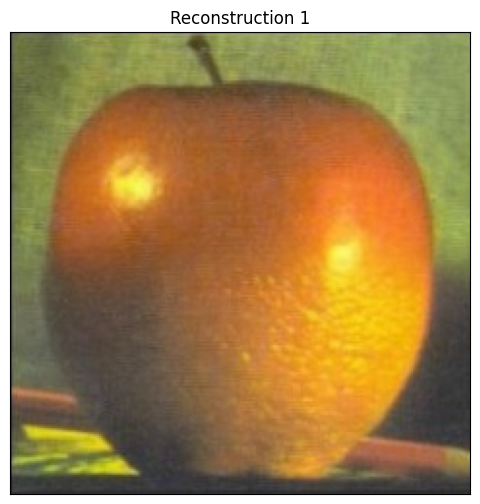

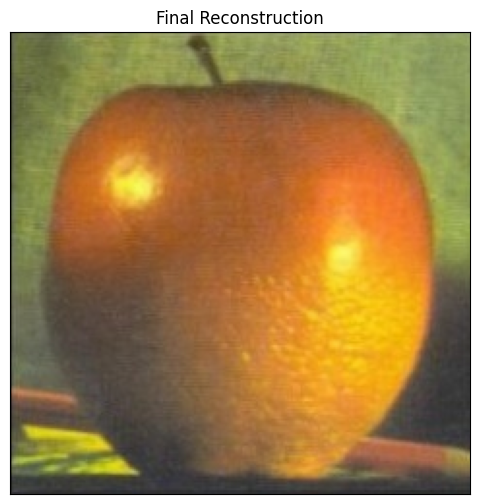

In [ ]:
# Comenzar desde el último nivel de la pirámide Laplaciana
recons = reconstructLap(combined_laplacian, flagInterp = cv2.INTER_LINEAR)
displayIm(rangeDisplay01(recons), title="Final Reconstruction")